# VIDEO GAME RECOMMENDER NOTEBOOK

# 1. Data collection

In this notebook we collect all the data and format the initial version of the JSON files.
We then create a mock user database with some user-game interactions.

In [ ]:
import requests
import json
from pathlib import Path
import pandas as pd
import time
import random

### Creation of API authentication caller

In [ ]:
# Twitch API credentials
CLIENT_ID = "client-id"
CLIENT_SECRET = "client-secret"

TOKEN_URL = "https://id.twitch.tv/oauth2/token"

def get_auth_header():
    print("Requesting OAuth token from Twitch...")
    token_resp = requests.post(
        TOKEN_URL,
        params={
            "client_id": CLIENT_ID,
            "client_secret": CLIENT_SECRET,
            "grant_type": "client_credentials",
        },
    )
    token_resp.raise_for_status()
    token_data = token_resp.json()
    access_token = token_data["access_token"]
    print("Got access token.")

    headers = {
        "Client-ID": CLIENT_ID,
        "Authorization": f"Bearer {access_token}",
    }

    return headers

### Call to fetch the games in json format

In [ ]:
IGDB_GAMES_URL = "https://api.igdb.com/v4/games"

# Folder for raw data
RAW_DIR = Path("./data/raw")
RAW_DIR.mkdir(parents=True, exist_ok=True)

headers = get_auth_header()

all_games = []
batch_size = 500
offset = 0

while True:
    print(f"Requesting games: offset={offset}, limit={batch_size}...")
    query = f"""
    fields id, name, summary, first_release_date, genres, platforms, keywords, involved_companies;
    where first_release_date != null;
    limit {batch_size};
    offset {offset};
    """

    resp = requests.post(IGDB_GAMES_URL, headers=headers, data=query)
    resp.raise_for_status()
    batch = resp.json()
    print(f"Got {len(batch)} games in this batch")

    if not batch:
        print("No more games, stopping.")
        break

    all_games.extend(batch)

    # move to next page
    offset += batch_size

    # optional: stop at some max
    # if offset >= 5000:
    #     break

print(f"Total games collected: {len(all_games)}")

out_file = RAW_DIR / "games_raw.json"
with out_file.open("w", encoding="utf-8") as f:
    json.dump(all_games, f, ensure_ascii=False, indent=2)

print(f"Saved all games to {out_file}")

### Format JSON files and add Steam IDs 

In [ ]:
RAW_DIR = Path("./data/raw")
JSON_DIR = Path("./data/json")
JSON_DIR.mkdir(parents=True, exist_ok=True)

headers = get_auth_header()

IGDB_GENRES_URL = "https://api.igdb.com/v4/genres"
IGDB_PLATFORMS_URL = "https://api.igdb.com/v4/platforms"
IGDB_KEYWORDS_URL = "https://api.igdb.com/v4/keywords"
IGDB_INVOLVED_URL = "https://api.igdb.com/v4/involved_companies"
IGDB_COMPANIES_URL = "https://api.igdb.com/v4/companies"
IGDB_EXTERNAL_GAMES_URL = "https://api.igdb.com/v4/external_games"
STEAM_CATEGORY_ID = 1  # IGDB enum value for Steam

In [ ]:
def fetch_steam_ids_for_games(game_ids):
    """
    Return a dict: { game_id (IGDB) -> steam_appid (string) }
    using IGDB's external_games endpoint, filtering category=Steam.
    """
    if not game_ids:
        return {}

    game_ids_list = sorted(list(game_ids))
    chunk_size = 500  # IGDB limit per request
    mapping = {}

    for i in range(0, len(game_ids_list), chunk_size):
        chunk = game_ids_list[i:i + chunk_size]
        ids_str = ",".join(str(gid) for gid in chunk)

        body = f"""
        fields game, uid, category;
        where game = ({ids_str}) & category = {STEAM_CATEGORY_ID};
        limit 500;
        """

        resp = requests.post(IGDB_EXTERNAL_GAMES_URL, headers=headers, data=body)
        resp.raise_for_status()
        items = resp.json()

        for item in items:
            game_id = item["game"]
            steam_uid = item["uid"]   # Steam appid as string/number
            # In case of multiple external entries per game, keep the first
            if game_id not in mapping:
                mapping[game_id] = str(steam_uid)

    return mapping

We load the raw games data collected earlier to extract Steam IDs.

In [ ]:
games_file = RAW_DIR / "games_raw.json"
with games_file.open("r", encoding="utf-8") as f:
    games = json.load(f)

print(f"Loaded {len(games)} games from {games_file}")

# collect all IGDB game_ids from raw games
game_ids_set = {g["id"] for g in games}

print("Fetching Steam appids from IGDB external_games...")
steam_ids_map = fetch_steam_ids_for_games(game_ids_set)
print(f"Found Steam appids for {len(steam_ids_map)} games")

Now we enrich games with steam_appid where available and start giving a format to the end JSON file

In [ ]:
rows_games = []
rows_game_genres = []
rows_game_platforms = []
rows_game_keywords = []
rows_game_companies = []

genre_ids_set = set()
platform_ids_set = set()
keyword_ids_set = set()
involved_company_ids_set = set()
company_ids_set = set()

for g in games:
    game_id = g["id"]  # use IGDB id as our game_id

    rows_games.append({
        "game_id": game_id,
        "igdb_id": g["id"],
        "name": g.get("name"),
        "summary": g.get("summary"),
        "first_release_date": g.get("first_release_date"),
        "steam_appid": steam_ids_map.get(game_id),
    })

    # genres
    for genre_id in g.get("genres", []):
        rows_game_genres.append({
            "game_id": game_id,
            "genre_id": genre_id,
        })
        genre_ids_set.add(genre_id)

    # platforms
    for platform_id in g.get("platforms", []):
        rows_game_platforms.append({
            "game_id": game_id,
            "platform_id": platform_id,
        })
        platform_ids_set.add(platform_id)

    # keywords
    for keyword_id in g.get("keywords", []):
        rows_game_keywords.append({
            "game_id": game_id,
            "keyword_id": keyword_id,
        })
        keyword_ids_set.add(keyword_id)

    # involved_companies
    for inv_id in g.get("involved_companies", []):
        # we only know the involved_company ID for now
        rows_game_companies.append({
            "game_id": game_id,
            "involved_company_id": inv_id,
        })
        involved_company_ids_set.add(inv_id)

In [ ]:
df_games = pd.DataFrame(rows_games)
df_game_genres = pd.DataFrame(rows_game_genres)
df_game_platforms = pd.DataFrame(rows_game_platforms)

df_game_keywords = pd.DataFrame(rows_game_keywords)
df_game_companies = pd.DataFrame(rows_game_companies)

We resolve genre and platform names next.

In [ ]:
def fetch_lookup_table(url, ids, id_field="id", name_field="name", chunk_size=500):
    """Fetch id->name mapping (genres, platforms, keywords, companies) from IGDB in chunks."""
    if not ids:
        return pd.DataFrame(columns=[id_field, name_field])

    ids_list = sorted(list(ids))
    frames = []

    for start in range(0, len(ids_list), chunk_size):
        chunk = ids_list[start:start + chunk_size]
        ids_str = ",".join(str(i) for i in chunk)

        body = f"""
        fields {id_field}, {name_field};
        where id = ({ids_str});
        limit {len(chunk)};
        """

        print(f"Fetching lookup from {url}: {start}–{start + len(chunk)} of {len(ids_list)}")
        resp = requests.post(url, headers=headers, data=body)

        if resp.status_code != 200:
            print("Error response:", resp.status_code, resp.text[:300])
            resp.raise_for_status()

        items = resp.json()
        if items:
            df_chunk = pd.DataFrame(items)[[id_field, name_field]]
            frames.append(df_chunk)

        # short delay to avoid hammering the API
        time.sleep(0.2)

    if frames:
        df = pd.concat(frames, ignore_index=True)
        df = df.drop_duplicates(subset=[id_field])
    else:
        df = pd.DataFrame(columns=[id_field, name_field])

    return df

In [ ]:

def fetch_involved_companies(ids, chunk_size=200):
    """
    Fetch involved_companies rows from IGDB in chunks to avoid 413 / payload too large.
    Returns a DataFrame with columns:
    id, company, game, developer, publisher, porting, supporting
    """
    if not ids:
        return pd.DataFrame(columns=["id", "company", "game", "developer", "publisher", "porting", "supporting"])

    ids_list = sorted(list(ids))
    frames = []

    for start in range(0, len(ids_list), chunk_size):
        chunk = ids_list[start:start + chunk_size]
        ids_str = ",".join(str(i) for i in chunk)

        body = f"""
        fields id, company, game, developer, publisher, porting, supporting;
        where id = ({ids_str});
        limit {len(chunk)};
        """

        print(f"Fetching involved_companies: {start}–{start + len(chunk)} of {len(ids_list)}")
        resp = requests.post(IGDB_INVOLVED_URL, headers=headers, data=body)

        if resp.status_code != 200:
            print("Error response from involved_companies:", resp.status_code, resp.text[:300])
            resp.raise_for_status()

        items = resp.json()
        if items:
            df_chunk = pd.DataFrame(items)
            frames.append(df_chunk)

        # be nice to IGDB
        time.sleep(0.2)

    if frames:
        df = pd.concat(frames, ignore_index=True)
        df = df.drop_duplicates(subset=["id"])
    else:
        df = pd.DataFrame(columns=["id", "company", "game", "developer", "publisher", "porting", "supporting"])

    return df

In [ ]:
# genre lookup
df_genres = fetch_lookup_table(IGDB_GENRES_URL, genre_ids_set, id_field="id", name_field="name")
df_genres = df_genres.rename(columns={"id": "genre_id"})

# platform lookup
df_platforms = fetch_lookup_table(IGDB_PLATFORMS_URL, platform_ids_set, id_field="id", name_field="name")
df_platforms = df_platforms.rename(columns={"id": "platform_id"})

# keyword lookup
df_keywords = fetch_lookup_table(IGDB_KEYWORDS_URL, keyword_ids_set, id_field="id", name_field="name")
df_keywords = df_keywords.rename(columns={"id": "keyword_id"})

df_involved = fetch_involved_companies(involved_company_ids_set)

# collect company IDs from here
if not df_involved.empty:
    company_ids_set = set(df_involved["company"].tolist())
else:
    company_ids_set = set()

df_companies = fetch_lookup_table(IGDB_COMPANIES_URL, company_ids_set, id_field="id", name_field="name")
df_companies = df_companies.rename(columns={"id": "company_id"})

We save all the JSON files.

In [ ]:
def save_df_as_json(df, path):
    records = df.to_dict(orient="records")
    with path.open("w", encoding="utf-8") as f:
        json.dump(records, f, ensure_ascii=False, indent=2)

save_df_as_json(df_games, JSON_DIR / "games.json")
save_df_as_json(df_game_genres, JSON_DIR / "game_genres.json")
save_df_as_json(df_game_platforms, JSON_DIR / "game_platforms.json")
save_df_as_json(df_genres, JSON_DIR / "genres.json")
save_df_as_json(df_platforms, JSON_DIR / "platforms.json")

save_df_as_json(df_game_keywords, JSON_DIR / "game_keywords.json")
save_df_as_json(df_keywords, JSON_DIR / "keywords.json")
save_df_as_json(df_game_companies, JSON_DIR / "game_involved_companies.json")
save_df_as_json(df_involved, JSON_DIR / "involved_companies_raw.json")
save_df_as_json(df_companies, JSON_DIR / "companies.json")

print("Saved JSON files to", JSON_DIR)

### Fetching of the Steam reviews

In [ ]:
GAMES_FILE = JSON_DIR / "games.json"
OUT_FILE = JSON_DIR / "steam_reviews.json"

STEAM_REVIEW_URL = (
    "https://store.steampowered.com/appreviews/{appid}"
    "?json=1&language=all&purchase_type=all&num_per_page=0"
)

Load the games from the file.

In [ ]:
with GAMES_FILE.open("r", encoding="utf-8") as f:
    games = json.load(f)

Get the games with Steam ID and look for their reviews.

In [ ]:
rows_reviews = []

for g in games:
    appid = g.get("steam_appid")
    game_id = g["game_id"]

    if not appid:
        continue  # skip games without steam mapping

    url = STEAM_REVIEW_URL.format(appid=appid)
    print(f"Fetching reviews for game_id={game_id}, appid={appid} ...")

    try:
        resp = requests.get(url)
        resp.raise_for_status()
        data = resp.json()

        summary = data.get("query_summary", {})
        rows_reviews.append({
            "game_id": game_id,
            "steam_appid": appid,
            "total_positive": summary.get("total_positive", 0),
            "total_negative": summary.get("total_negative", 0),
            "total_reviews": summary.get("total_reviews", 0),
        })

        # small delay to be polite
        time.sleep(0.2)

    except Exception as e:
        print(f"Error for appid={appid}: {e}")

Save into JSON.

In [ ]:
with OUT_FILE.open("w", encoding="utf-8") as f:
    json.dump(rows_reviews, f, ensure_ascii=False, indent=2)

print(f"Saved Steam review stats to {OUT_FILE}")

### Generation of the mock users

In [ ]:
USERS_OUT_FILE = JSON_DIR / "users.json"
USER_GAMES_OUT_FILE = JSON_DIR / "user_games.json"

N_USERS = 10000
MIN_GAMES_PER_USER = 1
MAX_GAMES_PER_USER = 50

# some random countries to add more stuff
COUNTRIES = ["US", "GB", "DE", "FR", "ES", "IT", "BR", "CA", "AU", "JP"]

Load the games file and filter for those with Steam ID.

In [ ]:
with GAMES_FILE.open("r", encoding="utf-8") as f:
    games = json.load(f)

print(f"Loaded {len(games)} games from {GAMES_FILE}")

# Filter to games that have a steam_appid
games_with_appid = [g for g in games if g.get("steam_appid")]
if games_with_appid:
    games = games_with_appid
    print(f"Using {len(games)} games that have a Steam appid")

if not games:
    raise RuntimeError("No games available to generate interactions!")

game_ids = [g["game_id"] for g in games]

Generate the users.

In [ ]:
def generate_user(user_id: int) -> dict:
    username = f"user_{user_id}"
    country = random.choice(COUNTRIES)
    age = random.randint(16, 45)  # arbitrary range

    return {
        "user_id": user_id,
        "username": username,
        "country": country,
        "age": age,
    }

In [ ]:
users = [generate_user(i) for i in range(1, N_USERS + 1)]
print(f"Generated {len(users)} mock users")

Generate user-game interactions.

In [ ]:
def generate_user_games(user_id: int) -> list[dict]:
    """
    Generate a random list of interactions for a single user.
    Each interaction has: user_id, game_id, rating, playtime_hours.
    """
    n_games = random.randint(MIN_GAMES_PER_USER, MAX_GAMES_PER_USER)
    # sample without replacement so each user doesn't repeat the same game
    sampled_game_ids = random.sample(game_ids, k=min(n_games, len(game_ids)))

    interactions = []
    for gid in sampled_game_ids:
        # rating: skew towards higher ratings a bit (gamers rarely rate 1/5)
        rating = round(min(max(random.gauss(3.8, 0.8), 1.0), 5.0), 1)

        # playtime: heavy-tailed – many low-play games, some very high
        # log-normal-ish: exp of a normal
        base = random.gauss(2.0, 1.0)
        playtime_hours = max(0.1, round((2.71828 ** base), 1))  # e^base, clamp at 0.1

        interactions.append({
            "user_id": user_id,
            "game_id": gid,
            "rating": rating,
            "playtime_hours": playtime_hours,
        })

    return interactions

In [ ]:
user_games = []
for u in users:
    ug = generate_user_games(u["user_id"])
    user_games.extend(ug)

print(f"Generated {len(user_games)} user-game interactions")

Save to JSON.

In [ ]:
with USERS_OUT_FILE.open("w", encoding="utf-8") as f:
    json.dump(users, f, ensure_ascii=False, indent=2)

with USER_GAMES_OUT_FILE.open("w", encoding="utf-8") as f:
    json.dump(user_games, f, ensure_ascii=False, indent=2)

print(f"Saved users to {USERS_OUT_FILE}")
print(f"Saved user-game interactions to {USER_GAMES_OUT_FILE}")

# 2.1 Data Preprocessing: Clean Game Overview Dataset

This notebook builds a clean, merged game overview dataset from multiple raw JSON files
(genres, platforms, companies, keywords, and Steam reviews). The final result is saved
as `game_overview_final_vol2.json` and will be used by the later recommendation methods.


## Imports and configuration

In [ ]:
import pandas as pd
from pathlib import Path
import json

from pathlib import Path
import pandas as pd

DATA_FOLDER = Path("./data/json") 

## Function to generate the clean game overview dataset

This function loads all raw JSON files, merges them into a single DataFrame with
textual metadata and a Steam rating, performs basic cleaning, and saves the result.

In [ ]:
def generate_clean_game_overview():
    games = pd.read_json(DATA_FOLDER / "games.zip")
    genres = pd.read_json(DATA_FOLDER / "genres.json")
    platforms = pd.read_json(DATA_FOLDER / "platforms.json")
    companies = pd.read_json(DATA_FOLDER / "companies.json")
    keywords = pd.read_json(DATA_FOLDER / "keywords.json")
    game_genres = pd.read_json(DATA_FOLDER / "game_genres.json")
    game_platforms = pd.read_json(DATA_FOLDER / "game_platforms.json")
    game_involved = pd.read_json(DATA_FOLDER / "game_involved_companies.json")
    game_keywords = pd.read_json(DATA_FOLDER / "game_keywords.json")
    involved_raw = pd.read_json(DATA_FOLDER / "involved_companies_raw.json")
    reviews = pd.read_json(DATA_FOLDER / "steam_reviews.json")

    genre_map = dict(zip(genres.genre_id.astype(str), genres.name))
    platform_map = dict(zip(platforms.platform_id.astype(str), platforms.name))
    company_map = dict(zip(companies.company_id.astype(str), companies.name))
    keyword_map = dict(zip(keywords.keyword_id.astype(str), keywords.name))

    def join_names(df, id_col, map_dict):
        df = df.copy()
        df[id_col] = df[id_col].astype(str)
        df["name"] = df[id_col].map(map_dict)
        return (
            df.groupby("game_id")["name"]
            .apply(lambda x: ", ".join(sorted(set(x.dropna()))))
        )

    genre_text = join_names(game_genres, "genre_id", genre_map)
    platform_text = join_names(game_platforms, "platform_id", platform_map)
    keyword_text = join_names(game_keywords, "keyword_id", keyword_map)

    # Filter involved companies (require at least 1 True flag)
    involved_filtered = involved_raw[
        involved_raw[["developer", "porting", "publisher", "supporting"]].any(axis=1)
    ]
    involved_filtered["company"] = involved_filtered["company"].astype(str)
    involved_filtered["name"] = involved_filtered["company"].map(company_map)

    company_text = (
        involved_filtered
        .groupby("game")["name"]
        .apply(lambda x: ", ".join(sorted(set(x.dropna()))))
    )
    company_text.index.name = "game_id"

    # Merge into games
    df = games.copy()
    df["game_id"] = df["game_id"].astype(int)
    df = df.set_index("game_id")

    df["genres"] = genre_text
    df["platforms"] = platform_text
    df["companies"] = company_text
    df["keywords"] = keyword_text

    # Compute statistics of reviews and create rating scores
    reviews["game_id"] = reviews["game_id"].astype(int)
    reviews = reviews.set_index("game_id")

    mean_reviews = reviews["total_reviews"].mean()
    std_reviews = reviews["total_reviews"].std()
    median_reviews = reviews["total_reviews"].median()
    p25 = reviews["total_reviews"].quantile(0.25)
    p50 = reviews["total_reviews"].quantile(0.50)
    p75 = reviews["total_reviews"].quantile(0.75)
    p90 = reviews["total_reviews"].quantile(0.90)

    print("\n===== STATISTICS =====")
    print(f"Mean reviews: {mean_reviews:.2f}")
    print(f"Std dev: {std_reviews:.2f}")
    print(f"Median: {median_reviews:.0f}")
    print(f"25th percentile: {p25:.0f}")
    print(f"50th percentile: {p50:.0f}")
    print(f"75th percentile: {p75:.0f}")
    print(f"90th percentile: {p90:.0f}")
    print("=============================\n")

    min_reviews = 8
    valid_reviews = reviews[reviews["total_reviews"] >= min_reviews].copy()
    valid_reviews["steam_rating"] = valid_reviews["total_positive"] / valid_reviews["total_reviews"]
    df["steam_rating"] = df.index.map(valid_reviews["steam_rating"])
    df = df[df["steam_rating"].notna()]

    # Cleaning after merge
    # df = df.dropna(subset=["genres", "platforms", "companies"])
    df = df.dropna(subset=["genres"])

    # Date adjustments
    df["first_release_date"] = pd.to_datetime(df["first_release_date"], unit='s')
    df["first_release_date"] = df["first_release_date"].dt.strftime("%Y-%m-%d")

    # Final dataset
    df = df.reset_index()[
        [
            "game_id",
            "name",
            "summary",
            "first_release_date",
            "genres",
            "platforms",
            "companies",
            "keywords",
            "steam_rating"
        ]
    ]

    # Save
    out = DATA_FOLDER / "game_overview_final_vol2.json"
    df.to_json(out, orient="records", indent=2, force_ascii=False)
    print(f"Saved final merged clean dataset to: {out}")

    return df


## Generate and inspect the clean dataset

In [ ]:
if __name__ == "__main__":
    generate_clean_game_overview()
    df = pd.read_json(DATA_FOLDER / "game_overview_final_vol2.json")
    print(len(df))


## Check missing values in key text fields

This helper function prints how many games are missing `genres` or `companies`
in the final merged dataset.

In [ ]:
def inspect_nulls(df):
    # Columns to inspect
    cols = ["genres", "companies"]

    print("\n===== NULL COUNTS =====")
    total = len(df)
    print(f"Total entries: {total}\n")
    for col in cols:
        null_count = df[col].isna().sum()
        print(f"{col}: {null_count} nulls ({null_count/total*100:.2f}%)")

    print("\n===== COMBINED NULLS =====")

    # Null in genres AND companies
    both2 = df[df["genres"].isna() & df["companies"].isna()]
    print(f"Null in BOTH genres & companies: {len(both2)}")

    print("\n=========================\n")

inspect_nulls(df)


# 3.1 Embedding Builder 

This notebook is used to sentence embeddings for each game in the dataset

Inputs:

data/json/game_overview_final_vol2.json
Outputs:

embeddings_FINAL.py ; a matrix of shape (n_games, embedding_dim)
games_df_FINAL.pkl ; a pandas DataFrame with all the necessary features for posterior analysis

In [3]:
# Imports 
import pandas as pd
from sentence_transformers import SentenceTransformer
import numpy as np

## Load dataset

In [4]:
# Load dataset
df = pd.read_json("../data/json/game_overview_final_vol2.json")
df = df.reset_index(drop=True)

print("Number of games:", len(df))
df.head()

Number of games: 10476


,game_id,name,summary,first_release_date,genres,platforms,companies,keywords,steam_rating
0,340494,Hunter Hitman,Hunt or be hunted. Execute stealth kills and s...,2025-01-02,Strategy,"Mac, PC (Microsoft Windows)",None,None,0.707317
1,327987,Slender: Reborn,Rediscover terror in this reimagined classic s...,2022-02-10,"Adventure, Indie, Simulator",PC (Microsoft Windows),"CreativeForge Games, Jeff Winner","creepypasta, dark, fangame, psychological horr...",0.648148
2,237944,Train Sim World 3: Amtrak's Acela,America's Fastest Train! Race along Northeast ...,2023-02-21,Simulator,PC (Microsoft Windows),None,None,0.716981
3,325912,DCS World: NS 430 Navigation System for Mi-8MT...,The NS 430 for the Mi-8MTV2 module integrates ...,2021-11-06,Simulator,PC (Microsoft Windows),Eagle Dynamics,None,0.444444
4,301417,Temple of Shadows,Embark on an epic adventure as Sabastian Harri...,2024-11-27,"Adventure, Indie, Puzzle",PC (Microsoft Windows),DRB Studios,"archeology, physics puzzles, suspense",0.750000


## Build text to embed

In [5]:
def make_text(row):
    parts = []
    
    for col in ['name', 'summary', 'genres', 'platforms', 'companies', 'keywords']:
        if col in row:
            val = row[col]
            if isinstance(val, str) and val.strip():
                parts.append(val)

    return " ".join(parts)

df['text'] = df.apply(make_text, axis=1)

print(df[['game_id', 'name', 'text']].head())
print(df.shape)

   game_id                                               name  \
0   340494                                      Hunter Hitman   
1   327987                                    Slender: Reborn   
2   237944                  Train Sim World 3: Amtrak's Acela   
3   325912  DCS World: NS 430 Navigation System for Mi-8MT...   
4   301417                                  Temple of Shadows   

                                                text  
0  Hunter Hitman Hunt or be hunted. Execute steal...  
1  Slender: Reborn Rediscover terror in this reim...  
2  Train Sim World 3: Amtrak's Acela America's Fa...  
3  DCS World: NS 430 Navigation System for Mi-8MT...  
4  Temple of Shadows Embark on an epic adventure ...  
(10476, 10)


In [6]:

# Convert the release date column to an actual date time with value 0-1, 0 being the oldest game in the dataset, and 1 being the most recent 
df["first_release_date"] = pd.to_datetime(df["first_release_date"], errors="coerce")

min_date = df["first_release_date"].min()
max_date = df["first_release_date"].max()

date_range_days = (max_date - min_date).days

def compute_recency(d):
    if pd.isna(d):
        return 0.5
    
    return (d - min_date).days/date_range_days
df["recency"] = df["first_release_date"].apply(compute_recency)

## Generate the embeddings and save themm

In [7]:
#Load embedding model (change device to 'cuda if GPU is desired to run  the SentenceTransformer)
model = SentenceTransformer("all-MiniLM-L6-v2", device="cpu")

#Encode to embedding
texts = df["text"].tolist()
embeddings = model.encode(texts, convert_to_numpy=True, show_progress_bar=True)

# Print and normalize embeddings
print(embeddings.shape)
embeddings = embeddings / np.linalg.norm(embeddings, axis=1, keepdims=True)
print(df.loc[1])

Batches: 100%|██████████| 328/328 [02:13<00:00,  2.45it/s]

(10476, 384)
game_id                                                          327987
name                                                    Slender: Reborn
summary               Rediscover terror in this reimagined classic s...
first_release_date                                  2022-02-10 00:00:00
genres                                      Adventure, Indie, Simulator
platforms                                        PC (Microsoft Windows)
companies                              CreativeForge Games, Jeff Winner
keywords              creepypasta, dark, fangame, psychological horr...
steam_rating                                                   0.648148
text                  Slender: Reborn Rediscover terror in this reim...
recency                                                        0.929315
Name: 1, dtype: object


In [8]:
# Save embeddings and the dataset to use in the next methods
np.save("../data/embeddings_FINAL.npy", embeddings)
df.to_pickle("../data/games_df_FINAL.pkl") 

# 3.2 LSH with embeddings 

This notebook builds a simple LSH index on top of precomputed embeddings and provides a recommendation function

It assumes you already have run the Embedding Builder notebook and generated:

games_df.pkl; a DataFrame with game metadata
embeddings.npy; numpy array of shape (n_games, embedding_dim)
Steps taken:

Load the embeddings and game data
Generate random hyperplanes and build LSH index
Implement LSH query to get candidate neighbours
Rank candidates using cosine similarity + rating + recency
Show example recommendations for a given game index

## Get the imports and embeddings

In [9]:
import pandas as pd
import numpy as np
from collections import defaultdict
from sklearn.metrics.pairwise import cosine_similarity

# In the original script we used timing/tracemalloc for profiling.
# In this notebook we focus on the logic and interactivity, so we skip that.

df = pd.read_pickle("../data/games_df_FINAL.pkl")
embeddings = np.load("../data/embeddings_FINAL.npy")
print("Embeddings shape:", embeddings.shape)
print("Number of games:", len(df))

Embeddings shape: (10476, 384)
Number of games: 10476


## generate random hyperplanes

In [10]:
# Several sets of random hyperplanes are created, each corresponding to one LSH table, and each hyperplane used to generate one bit of the hash key
def generate_hyperplanes(num_tables, num_planes, dim, seed= 0):
    rng = np.random.RandomState(seed)
    hyperplanes = []
    for _ in range(num_tables):
        planes = rng.randn(num_planes, dim)
        planes /= np.linalg.norm(planes, axis = 1, keepdims = True) +1e-9
        hyperplanes.append(planes)
    
    return hyperplanes

# check it
dim = embeddings.shape[1]
num_tables = 10
num_planes = 16

hyperplanes = generate_hyperplanes(num_tables, num_planes, dim, seed=33)
print(hyperplanes)

[array([[-0.01636433, -0.0822688 , -0.07879106, ..., -0.03037444,
         0.02857754,  0.05055213],
       [ 0.04226748,  0.01131865, -0.00684458, ..., -0.00090081,
        -0.04132469,  0.03906224],
       [ 0.00036863, -0.00614149, -0.0029053 , ..., -0.02039806,
        -0.06660375, -0.00144424],
       ...,
       [-0.02160066,  0.00627249,  0.05156927, ...,  0.04815518,
         0.03370179, -0.03259623],
       [-0.16762874,  0.01323529,  0.035048  , ...,  0.07726289,
         0.00270281,  0.01887253],
       [ 0.00026104,  0.00025794,  0.05709854, ..., -0.07947919,
         0.00487741,  0.00843518]], shape=(16, 384)), array([[ 0.01588397,  0.08047979, -0.00158552, ...,  0.00705402,
         0.04997843,  0.02041587],
       [ 0.01394603, -0.08109805, -0.02365737, ..., -0.12642717,
        -0.02261045,  0.05341474],
       [-0.05057007,  0.06450797,  0.05145814, ..., -0.04600032,
         0.03888609, -0.01980033],
       ...,
       [-0.02351672, -0.00966409, -0.03954437, ...,  0.0

## Hash each embedding into buckets 

In [11]:
def hash_v(v, planes):
    projections = planes @ v
    bits = projections > 0
    key = ''.join('1' if b else '0' for b in bits)
    return key

## Get LSH index, which is tables with buckets

In [12]:
# We build one hash table per hyperplane set. Each table maps a bitstring key to a bucket of game indices whose embedding fall into that region

def build_lsh_idx(embeddings, hyperplanes):
    n, dim = embeddings.shape
    num_tables = len(hyperplanes)

    tables = [defaultdict(set) for _ in range(num_tables)]


    for idx, v in enumerate(embeddings):
        for t, planes in enumerate(hyperplanes):
            key = hash_v(v, planes)
            tables[t][key].add(idx)
    
    return tables

# check it
tables = build_lsh_idx(embeddings, hyperplanes)

## query LSH; get candidate neighbours for a game

In [13]:
# Given a game idx, we compute its hash key in each table, collect all indices in the corresponding bucket, union them into a candidate set
def lsh_query(idx, embeddings, hyperplanes, tables):
    v = embeddings[idx]
    candidates = set()

    for t, planes in enumerate(hyperplanes):
        key = hash_v(v, planes)
        bucket = tables[t].get(key, set())
        candidates |= bucket

    candidates.discard(idx)
    return candidates

#test
cand = lsh_query(0, embeddings, hyperplanes, tables)
print("Candidates for game 0:", cand)
for candidate in cand:
    print(df.loc[candidate, 'name'])

Candidates for game 0: {2050, 10441, 7566, 848, 7442, 4948, 10265, 8476, 2208, 10144, 5221, 6376, 3116, 8428, 3886, 6323, 1141, 9205, 2551, 5368, 4921, 6907, 1598}
Trine 2: Goblin Menace
Rake Remastered
Total War: Shogun 2 - Fall of the Samurai: The Saga Faction Pack
DNF Duel: Season Pass
Lords of the Fallen: The Foundation Boost
Tri.Defender
Injustice 2: Reverse Flash
Deep Space Scoundrel
Quake III: Team Arena
Running into the Cyberpunk
Slime VS. Female Hero Party
Scratch Man
Renegade Ops: Reinforcement Pack
National Zombie Park
Electric Zombies
Ballistic Protection
Astronite
Freebooter of Splorr!!
Darkest Dungeon: The Musketeer
Naruto x Boruto: Ultimate Ninja Storm Connection - DLC Pack 2
TROUBLESHOOTER: Abandoned Children - Giselle's Costume Set
Sweet Berry Crush
Auto Dungeon


## Recommender

In [14]:
# Using the candidates for a given game, the cosine similarity between the candidates and the game is computed and normalized to [0,1]. 
# Combining similarity, rating and recency, a final score is obtained for each candidate (0-1) and the results are sorted to print the top recommendations based on this score.
# The weights to similarity, rating and recency can be changed to emphasize one or the other. 
def recommend_lsh_embedding(idx, embeddings, hyperplanes, tables, df, top=5):
    v = embeddings[idx]
    cand = lsh_query(idx, embeddings, hyperplanes, tables)

    if not cand:
        print(f"No candidates for {df.loc[idx, 'name']}")
        return []

    cand_indices = np.array(list(cand), dtype=int)

    sim = cosine_similarity(
        v.reshape(1, -1),
        embeddings[cand_indices]
    )  # shape: (1, n_candidates)

    sim_flat = sim[0]  
    cos_norm = (sim_flat + 1.0) / 2.0


    ratings = df.loc[cand_indices, 'steam_rating'].astype(float).to_numpy()
    recency = df.loc[cand_indices, 'recency'].astype(float).to_numpy()


    w_sim = 0.7
    w_rating = 0.2
    w_date = 0.1

    final_score = (w_sim*cos_norm + w_rating*ratings + w_date*recency)
    
    order = np.argsort(final_score)[::-1]
    ordered_indices = cand_indices[order]
    ordered_cos_norm = cos_norm[order]    
    ordered_rating = ratings[order]
    ordered_recency = recency[order]
    ordered_score = final_score[order]

    results = list(zip(
        ordered_indices[:top], 
        ordered_cos_norm[:top],
        ordered_rating[:top],
        ordered_recency[:top],
        ordered_score[:top]))

    print(f"Query: {df.loc[idx, 'name']}")
    print("Recommendations (cosine_norm, rating, recency, score):")

    for j, cos_s, r, rec, score in results:
        print(
            f" --> {df.loc[j, 'name']} "
            f"(cos={cos_s:.3f}, rating={r:.3f}, recency = {rec:.3f}, score={score:.3f})"
        )

    return results


#test
recommend_lsh_embedding(0, embeddings, hyperplanes, tables, df, top=3)

Query: Hunter Hitman
Recommendations (cosine_norm, rating, recency, score):
 --> Running into the Cyberpunk (cos=0.677, rating=1.000, recency = 0.941, score=0.768)
 --> Scratch Man (cos=0.681, rating=0.923, recency = 0.955, score=0.757)
 --> Freebooter of Splorr!! (cos=0.654, rating=1.000, recency = 0.919, score=0.750)


[(np.int64(10144),
  np.float32(0.6766021),
  np.float64(1.0),
  np.float64(0.9410124943999204),
  np.float64(0.7677227370574846)),
 (np.int64(6376),
  np.float32(0.6806127),
  np.float64(0.9230769231),
  np.float64(0.9554482552640748),
  np.float64(0.7565890765328211)),
 (np.int64(9205),
  np.float32(0.6544188),
  np.float64(1.0),
  np.float64(0.9187117327890886),
  np.float64(0.7499643396302271))]

# LSH with tokens 
This notebook implements an LSH-based recommender using token-shingles and MinHash signatures

It:

Loads the raw game dataset
builds a text field per game
Creates word shingles
Computes MinHash signatures
Builds LSH using banding
Finds candidate similar games and ranks them using: Jaccard similarity, rating and recency.

In [15]:
# Load the necessary packages
import pandas as pd
import mmh3
from  collections import defaultdict
import re

## Get the text from the dataset and build the text to shingle

In [16]:
# Normalize the text so that no "weird" shingles are formed later
df = pd.read_json("../data/json/game_overview_final_vol2.json")
df = df.reset_index(drop=True)

def normalize_text(text: str) -> str:
    text = text.lower()
    text = text.replace(";", " ")         
    text = re.sub(r"[^a-z0-9\s]+", " ", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text

def make_text(row):
    parts =[]

    for col in ['name', 'summary', 'genres', 'platforms', 'companies', 'keywords']:
        if col in row:
            val = row[col]
            if isinstance(val, str) and val.strip():
                parts.append(val)
    
    return " ".join(parts)

df['text'] = df.apply(make_text, axis = 1)

print(df[["game_id", "name", "text"]].head())
df.shape

   game_id                                               name  \
0   340494                                      Hunter Hitman   
1   327987                                    Slender: Reborn   
2   237944                  Train Sim World 3: Amtrak's Acela   
3   325912  DCS World: NS 430 Navigation System for Mi-8MT...   
4   301417                                  Temple of Shadows   

                                                text  
0  Hunter Hitman Hunt or be hunted. Execute steal...  
1  Slender: Reborn Rediscover terror in this reim...  
2  Train Sim World 3: Amtrak's Acela America's Fa...  
3  DCS World: NS 430 Navigation System for Mi-8MT...  
4  Temple of Shadows Embark on an epic adventure ...  


(10476, 10)

## Compute a normalized recency score [0, 1] from the release date

In [17]:
df["first_release_date"] = pd.to_datetime(df["first_release_date"], errors="coerce")

min_date = df["first_release_date"].min()
max_date = df["first_release_date"].max()

date_range_days = (max_date - min_date).days

def compute_recency(d):
    if pd.isna(d):
        return 0.5
    
    return (d - min_date).days/date_range_days
df["recency"] = df["first_release_date"].apply(compute_recency)

## q - shingles 

In [18]:
# We turn each game's text into a set of word shingles. These shingles are the input to the MinHash function.
def shingle(text: str, q: int = 2):
    text = normalize_text(text)
    words = text.split()
    shingles = set()
    for i in range(len(words) - q + 1):
        sh = " ".join(words[i:i+q])
        shingles.add(sh)
    return shingles

NUM_HASHES = 100
BANDS = 50
ROWS_PER_BAND = 2

# Checking it works
print(df.loc[1, "text"])
print(shingle(df.loc[1, "text"], q=2))

Slender: Reborn Rediscover terror in this reimagined classic survival horror. Collect eight pages and evade the relentless Slenderman in a hauntingly realistic world rebuilt with updated graphics, adaptive AI, and immersive sound design. Prepare for unpredictable scares and a chilling atmosphere that redefines fear Adventure, Indie, Simulator PC (Microsoft Windows) CreativeForge Games, Jeff Winner creepypasta, dark, fangame, psychological horror, simulation, slender, slender man, unofficial remake
{'design prepare', 'collect eight', 'adventure indie', 'fear adventure', 'dark fangame', 'adaptive ai', 'windows creativeforge', 'horror simulation', 'the relentless', 'microsoft windows', 'updated graphics', 'pc microsoft', 'prepare for', 'jeff winner', 'winner creepypasta', 'psychological horror', 'reimagined classic', 'simulator pc', 'a chilling', 'rebuilt with', 'a hauntingly', 'with updated', 'creepypasta dark', 'slender slender', 'unpredictable scares', 'unofficial remake', 'for unpredi

## Compute a Minhash signature of length "num_hases"

In [19]:
def minhash_sign(shingles, num_hashes = NUM_HASHES):
    signature = []
    for seed in range(num_hashes):
        min_val = None
        for sh in shingles:
            h = mmh3.hash(sh, seed, signed=False)
            if (min_val is None) or (h < min_val):
                min_val = h
        signature.append(min_val)
    return signature

## get the signature for each game

In [20]:
def compute_sign(df, q=2, num_hashes = NUM_HASHES):
    signatures = {}
    shingle_cache = {}

    for idx, row in df.iterrows():
        text = row["text"]
        shingles = shingle(text, q = q)
        shingle_cache[idx] = shingles
        sig = minhash_sign(shingles, num_hashes= num_hashes)
        signatures[idx] = sig

    return signatures, shingle_cache

signatures, shingle_cache = compute_sign(df, q= 2, num_hashes= NUM_HASHES)

## Get LSH bands and buckets

In [21]:
def build_lsh_idx(signatures, bands=BANDS, row_band=ROWS_PER_BAND):
    buckets = defaultdict(set)
    for doc_id, sig in signatures.items():
        assert len(sig) == bands * row_band
        for b in range(bands):
            start = b * row_band
            end = start + row_band
            band_slice = tuple(sig[start:end])
            band_hash = hash(band_slice)
            buckets[(b, band_hash)].add(doc_id)
    return buckets

buckets = build_lsh_idx(signatures, bands=BANDS, row_band= ROWS_PER_BAND)

## Get candidate neighbours for a game

In [22]:
# we first retrieve candidates that share at least one band with the query game
def lsh_candidates(doc_id, signatures, buckets, bands=BANDS, row_band=ROWS_PER_BAND):
    sig = signatures[doc_id]
    candidates = set()
    for b in range(bands):
        start = b * row_band
        end = start + row_band
        band_slice = tuple(sig[start:end])
        band_hash = hash(band_slice)
        bucket_docs = buckets.get((b, band_hash), set())

        for other in bucket_docs:
            if other != doc_id:
                candidates.add(other)
    return candidates


# Check it on one game
doc = 0
candidates = lsh_candidates(doc, signatures, buckets)
print(f"Candidates for game 0: {candidates}")

Candidates for game 0: {2050, 4098, 6, 10247, 2056, 4105, 10252, 10253, 2067, 8211, 6165, 22, 10259, 8217, 4125, 2078, 30, 8224, 10274, 8228, 10276, 10279, 2088, 4137, 4138, 4142, 53, 8246, 57, 6201, 6202, 60, 2112, 8258, 2117, 6213, 6215, 10313, 75, 10316, 2124, 10319, 4175, 6225, 83, 6228, 86, 6231, 6232, 2134, 6234, 8283, 10332, 4192, 10337, 2146, 6242, 4196, 8290, 10340, 6247, 10349, 111, 112, 2164, 10365, 125, 6269, 8317, 2180, 4228, 134, 10374, 6280, 2186, 2188, 2189, 6287, 8337, 6292, 6293, 4248, 8344, 4250, 2203, 6303, 10399, 8354, 2214, 4263, 2221, 2222, 6320, 10436, 8390, 10443, 4316, 4318, 4319, 2272, 2273, 226, 8414, 6372, 229, 2283, 8427, 10475, 240, 241, 4336, 6392, 2298, 6396, 4351, 8454, 2322, 6418, 6419, 6421, 8470, 281, 283, 8479, 6436, 8486, 8488, 300, 4402, 6451, 2357, 4407, 4410, 6461, 2367, 320, 326, 328, 4427, 6476, 4435, 4437, 2390, 2391, 4445, 8543, 2401, 8545, 8552, 6506, 4460, 369, 6515, 2421, 376, 2430, 4481, 2434, 8579, 8581, 4487, 392, 2441, 4490, 8592, 40

## Calculate the Jaccard Similarity 

In [23]:
def jaccard_sim(sig1, sig2):
    total = sum(1 for a, b in zip(sig1, sig2) if a == b)
    return total/len(sig1)

# Recommender

In [24]:
# For a given game idx:
# - Get the candidates
# - Compute similarity of signatures
# - Filter by a minimum similarity threshold
# - Combine similarity, rating and recency into a final score (0-1)
# Sort the  final score and print the top results. The weights or threshold can be changed into what wants to be emphasized. 
def similar_games(doc_id, 
                  df, 
                  signatures,
                  buckets, 
                  bands=BANDS, 
                  row_band=ROWS_PER_BAND, 
                  thresh = 0.6,
                  w_sim = 0.7,
                  w_rating = 0.2,
                  w_date = 0.1,
                  rating_col = 'steam_rating',
                  recency_col = 'recency'):
    sig0 = signatures[doc_id]
    cand = lsh_candidates(doc_id, signatures, buckets, bands, row_band)

    results = []
    for other in cand:
        sim = jaccard_sim(sig0, signatures[other])

        if sim < thresh:
            continue
        
        rating = df.loc[other, rating_col]
        recency = df.loc[other, recency_col]
        
        score = (
            w_sim*sim + w_rating*rating + w_date*recency
        )

        results.append((other, sim, rating, recency, score))

    results.sort(key=lambda x:x[4], reverse=True)
    return results


#test it in one case:
idx = 0
res = similar_games(idx, df, signatures, buckets, bands=BANDS, row_band=ROWS_PER_BAND, thresh=0.2)
print("Query:", df.loc[idx, "name"])
print("Found", len(res), "similar games")

for other, sim, rating, recency, score in res[:10]:
    print(
        " -->", df.loc[other, "name"],
        f"(Jaccard={sim:.2f}, rating={rating:.2f}, recency = {recency:.2f}, score={score:.2f})"
    )

Query: Hunter Hitman
Found 2 similar games
 --> Chill Seekers (Jaccard=0.23, rating=1.00, recency = 0.97, score=0.46)
 --> Beast Collector (Jaccard=0.22, rating=0.55, recency = 0.96, score=0.36)


# Import Libraries for Kmeans and DBSCAN

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import tracemalloc
import random
import os

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from kneed import KneeLocator
from sklearn.neighbors import NearestNeighbors


# Optional: Set style for plots
sns.set(style="whitegrid")

# %matplotlib inline (for notebook environments only)

# Load embeddings and game dataframe

We load the final embedding matrix and the corresponding game dataframe.  
The embeddings are normalized and will be used directly for clustering.  
We also check the dimensions to make sure the rows align.

In [2]:
# Load embeddings and game metadata
emb_norm = np.load("../data/embeddings_FINAL.npy") 
df = pd.read_pickle("../data/games_df_FINAL.pkl")

# Check shapes
print("Embeddings shape:", emb_norm.shape)
print("Games dataframe shape:", df.shape)

Embeddings shape: (10476, 384)
Games dataframe shape: (10476, 11)


# Helper Functions

In [3]:
def track_memory_and_time(func):
    """
    Decorator to track memory usage and execution time of a function
    """
    def wrapper(*args, **kwargs):
        tracemalloc.start()
        start_time = time.time()
        result = func(*args, **kwargs)
        current, peak = tracemalloc.get_traced_memory()
        tracemalloc.stop()
        elapsed = time.time() - start_time
        print(f"Time: {elapsed:.2f} seconds | Peak memory: {peak / 1024**2:.2f} MB")
        return result
    return wrapper

In [4]:
def inspect_clusters(df, cluster_col="cluster_kmeans", n_clusters=4, n_samples=5, display_cols=None):
    """
    Print sample games from selected clusters.
    
    Always includes cluster 0 (if it exists), and randomly selects the remaining.
    """
    if display_cols is None:
        display_cols = ["name", "summary", "genres", "platforms"]
    
    unique_clusters = sorted(df[cluster_col].dropna().unique())
    
    if len(unique_clusters) == 0:
        print("No clusters found.")
        return
    
    clusters_to_show = []
    if 0 in unique_clusters:
        clusters_to_show.append(0)
        remaining_clusters = [c for c in unique_clusters if c != 0]
    else:
        remaining_clusters = unique_clusters
    
    random.seed(42)
    clusters_to_show += random.sample(remaining_clusters, min(n_clusters - len(clusters_to_show), len(remaining_clusters)))
    clusters_to_show = sorted(df[cluster_col].dropna().unique())

    for cluster_id in clusters_to_show:
        print("=" * 80)
        count = df[df[cluster_col] == cluster_id].shape[0]
        print(f"Cluster {cluster_id} — {count} games")
        print("=" * 80)
        
        sample = df[df[cluster_col] == cluster_id][display_cols].sample(n=min(n_samples, count), random_state=42)
        display(sample)

In [5]:
def evaluate_clustering(X, labels):
    """
    Compute Silhouette and Davies-Bouldin scores
    """
    if len(set(labels)) <= 1 or (len(set(labels)) == 2 and -1 in labels):
        print("Not enough clusters for evaluation")
        return None, None

    silhouette = silhouette_score(X, labels)
    db_index = davies_bouldin_score(X, labels)
    print(f"Silhouette Score: {silhouette:.4f}")
    print(f"Davies–Bouldin Index: {db_index:.4f}")

In [6]:
def plot_clusters(X, labels, title="Cluster Plot", figsize=(8,6), save_path="../data"):
    """
    Plot clustering results using both PCA and t-SNE for visualization.
    Saves plots in PNG format inside the specified folder.
    """
    os.makedirs(save_path, exist_ok=True)  # Ensure output folder exists
    fig, axs = plt.subplots(1, 2, figsize=(figsize[0]*2, figsize[1]))

    # PCA projection
    pca = PCA(n_components=2)
    reduced_pca = pca.fit_transform(X)
    scatter_pca = axs[0].scatter(reduced_pca[:, 0], reduced_pca[:, 1], c=labels, cmap="Set1", alpha=0.7)
    axs[0].set_title("PCA Projection")
    axs[0].set_xlabel("PCA 1")
    axs[0].set_ylabel("PCA 2")
    fig.colorbar(scatter_pca, ax=axs[0])

    # t-SNE projection
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    reduced_tsne = tsne.fit_transform(X)
    scatter_tsne = axs[1].scatter(reduced_tsne[:, 0], reduced_tsne[:, 1], c=labels, cmap="Set1", alpha=0.7)
    axs[1].set_title("t-SNE Projection")
    axs[1].set_xlabel("t-SNE 1")
    axs[1].set_ylabel("t-SNE 2")
    fig.colorbar(scatter_tsne, ax=axs[1])

    # Save plots
    filename_base = title.lower().replace(" ", "_")
    png_path = os.path.join(save_path, f"{filename_base}.png")
    plt.suptitle(title)
    plt.tight_layout()
    plt.savefig(png_path, dpi=300)
    print(f"Plot saved to: {png_path}")

    plt.show()

# 3.3 Apply KMeans Clustering

We apply the KMeans clustering algorithm on the normalized embeddings.  
We choose a number of clusters `k = 20` based on the approximate size and diversity of the dataset.  
After fitting the model, we assign each game to a cluster.

In [7]:
df_kmeans = df.copy()

##### Determine Optimal Number of Clusters with Elbow Method

To identify the most suitable number of clusters for KMeans, we use the **Elbow Method**.

This method involves the following steps:

1. We run **KMeans** for different values of k (number of clusters).
2. For each k, we compute the **inertia**, which is the within-cluster sum of squared distances (SSE).
3. We plot k versus inertia. The optimal k is typically at the "elbow" point — where the inertia starts decreasing more slowly.

This helps us balance between underfitting (too few clusters) and overfitting (too many clusters), and choose a value of k that offers a good trade-off between compactness and efficiency.

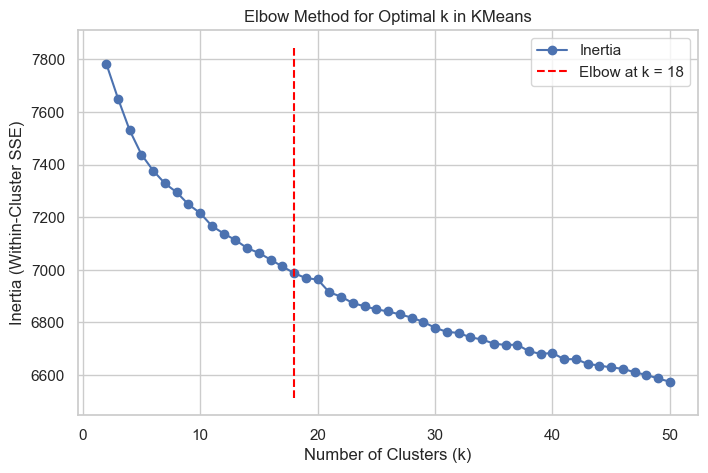

Optimal number of clusters (k) found by Elbow Method: 18


In [8]:
# Compute inertias for different k
inertias = []
k_values = list(range(2, 51))  # k from 2 to 50

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init="auto")
    kmeans.fit(emb_norm)
    inertias.append(kmeans.inertia_)

# Detect elbow point automatically
knee = KneeLocator(k_values, inertias, curve="convex", direction="decreasing")
k_optimal = knee.elbow

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertias, marker='o', label="Inertia")
plt.vlines(k_optimal, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label=f"Elbow at k = {k_optimal}")
plt.title("Elbow Method for Optimal k in KMeans")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Within-Cluster SSE)")
plt.grid(True)
plt.legend()
plt.show()

# Report optimal k
print(f"Optimal number of clusters (k) found by Elbow Method: {k_optimal}")

In [9]:
@track_memory_and_time
def run_kmeans_clustering(X, n_clusters=20, random_state=42):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state, n_init="auto")
    labels = kmeans.fit_predict(X)
    return labels

# Run KMeans
kmeans_labels = run_kmeans_clustering(emb_norm, n_clusters=k_optimal)

# Assign to dataframe
df_kmeans["cluster_kmeans"] = kmeans_labels

# Check basic cluster stats
print("Number of clusters found:", df_kmeans["cluster_kmeans"].nunique())
print(df_kmeans["cluster_kmeans"].value_counts().sort_index())

Time: 0.22 seconds | Peak memory: 30.73 MB
Number of clusters found: 18
cluster_kmeans
0     810
1     666
2     785
3     341
4     993
5     428
6     554
7     416
8     602
9     443
10    651
11    643
12    798
13    306
14    500
15    394
16    524
17    622
Name: count, dtype: int64


### Inspect KMeans Clusters

Let's look at a few clusters found by KMeans and inspect some sample games from each cluster.  
We display the name, summary, genres, and platforms to evaluate the internal coherence of the clusters.

In [10]:
inspect_clusters(df_kmeans, cluster_col="cluster_kmeans")

Cluster 0 — 810 games


,name,summary,genres,platforms
2954,Hitman 3: Chongqing,Under the flickering neon lights of busy cafes...,Adventure,PC (Microsoft Windows)
8387,Golden Rails: World's Fair,The mayor of your hometown needs your help con...,"Adventure, Indie, Strategy",PC (Microsoft Windows)
2650,Archaeology: Frozen Village,A game of the genre find the hidden object.,"Adventure, Indie, Racing, Role-playing (RPG), ...","Linux, Mac, PC (Microsoft Windows)"
3312,Ark: The Center Ascended,The Center is a free add-on for ARK: Survival ...,"Adventure, Indie, Role-playing (RPG)",PC (Microsoft Windows)
6590,Monster Adventure,In this game for kids full of weird characters...,"Adventure, Indie",PC (Microsoft Windows)


Cluster 1 — 666 games


,name,summary,genres,platforms
9845,DROD: King Dugan's Dungeon,What happened to Beethro on his first excursio...,"Adventure, Indie, Puzzle, Strategy",PC (Microsoft Windows)
2598,Square Enix AI Tech Preview: The Portopia Seri...,This software is an educational demonstration ...,"Adventure, Point-and-click",PC (Microsoft Windows)
10095,SCP: Nine-Tailed Fox,Experience the horrors of being the one suppos...,"Adventure, Indie, Shooter",PC (Microsoft Windows)
3843,Sophie's Safecracking Simulator,Crack simulated safe locks using real techniques!,"Puzzle, Simulator","Linux, Mac, PC (Microsoft Windows)"
7977,Blood Knuckle: Rooftop of The Impossible Skysc...,"Use your giant fist to punch, puzzle and scale...","Adventure, Indie",PC (Microsoft Windows)


Cluster 2 — 785 games


,name,summary,genres,platforms
9965,Digital Audio Wasteland,Digital Audio Wasteland is a comedic first per...,"Adventure, Indie",PC (Microsoft Windows)
864,Village Story,The main objective of the game is to build you...,Indie,PC (Microsoft Windows)
3895,Hyper Hardcore,You are hired! Join the planetary corporation ...,Indie,PC (Microsoft Windows)
3748,Annoy This Guy,Annoy this guys time in this comedic piece of ...,Indie,PC (Microsoft Windows)
4064,Ubaste,"Ubaste is a 3D platform jumping game, maneuver...",Indie,PC (Microsoft Windows)


Cluster 3 — 341 games


,name,summary,genres,platforms
9695,Car Mechanic Simulator 2015: Trader Pack,"New package of cars, parts and possibilities f...","Racing, Simulator","Mac, PC (Microsoft Windows)"
3530,Cygnus Racing League,On your marks! Get Set! SURVIVE! The Cygnus Ga...,"Indie, Racing",PC (Microsoft Windows)
3500,Forza Horizon 4: 2018 Aston Martin Vantage,2018 Aston Martin Vantage,Racing,"PC (Microsoft Windows), Xbox Series X|S"
1515,Turbo Golf Racing,Turbo Golf Racing is an arcade-style sports ra...,"Arcade, Racing, Sport","PC (Microsoft Windows), PlayStation 5, Xbox On..."
3956,Formula E powered by Virtually Live,Virtually Live enables fans to attend LIVE VR ...,"Racing, Simulator, Sport",PC (Microsoft Windows)


Cluster 4 — 993 games


,name,summary,genres,platforms
9643,Snapback,Snapback is a Speed-Runner Puzzle Platformer s...,Indie,PC (Microsoft Windows)
5663,Gaserb,Gaserb contains difficult puzzles that can be ...,"Indie, Platform, Puzzle",PC (Microsoft Windows)
6053,Aggressive Robot Vacuum,Aggressive Robot Vacuum-a robot vacuum cleaner...,"Indie, Simulator",PC (Microsoft Windows)
7059,Achievement Creator,"Create and send us your own art, meme or fun i...","Indie, Simulator",PC (Microsoft Windows)
9620,Gold Wiper,Gold Wiper is an arcade game like Qix and Gals...,Indie,PC (Microsoft Windows)


Cluster 5 — 428 games


,name,summary,genres,platforms
10223,Train Sim World 2020: BR Class 20 'Chopper' Loco,"A veteran in every right, the Class 20 has ear...",Simulator,PC (Microsoft Windows)
2440,Train Sim World 5: Peninsula Corridor: San Fra...,California Dreamin’ with the Peninsula Corrido...,Simulator,PC (Microsoft Windows)
4651,Microsoft Flight Simulator X: Steam Edition - ...,Virtavia’s Grumman EA-6B Prowler is the ideal ...,Simulator,PC (Microsoft Windows)
1087,Train Simulator 2021: DB BR 18 Steam Loco,A true legend makes its way to Train Simulator...,Simulator,PC (Microsoft Windows)
8793,Ikev,Ikev is a furniture assembling simulator in VR...,"Indie, Simulator",SteamVR


Cluster 6 — 554 games


,name,summary,genres,platforms
3475,Wizard Lady,This game is a classic memory game with severa...,Puzzle,PC (Microsoft Windows)
3460,Fucking Hell,Short Adult-Only Visual Novel featuring 4 girl...,"Adventure, Indie, Simulator",PC (Microsoft Windows)
5829,Borderus: Angels & Demons,"Enjoy the classic, ""Xonix"" style arcade gamepl...",Indie,PC (Microsoft Windows)
8900,Strip Shooter,Strip Shooter is a casual-indie game to undres...,"Adventure, Indie",PC (Microsoft Windows)
4594,Sex Adventures: The Job Interview,A visual novel about a young woman named Jessi...,Indie,PC (Microsoft Windows)


Cluster 7 — 416 games


,name,summary,genres,platforms
3204,Iron Conflict,"Fight for glory in Iron Conflict, an online co...","Indie, Real Time Strategy (RTS), Strategy",PC (Microsoft Windows)
7501,Total War: Three Kingdoms - Shi Xie,"Nepotism rules in the world of Shi Xie, and he...",Strategy,PC (Microsoft Windows)
10430,SOF: Enemy from the future,Lead the SOF squad and defend the world agains...,"Indie, Strategy, Tactical, Turn-based strategy...",PC (Microsoft Windows)
1983,"Warhammer 40,000: Armageddon - Glory of Macragge",Embark on the final Space Marine campaign of t...,"Strategy, Turn-based strategy (TBS)","Mac, PC (Microsoft Windows)"
1400,Hegemony III: The Eagle King,New Historical Campaign\nHegemony III's first ...,"Indie, Real Time Strategy (RTS), Role-playing ...",PC (Microsoft Windows)


Cluster 8 — 602 games


,name,summary,genres,platforms
2221,Runaway Demon Bride,Summoned to another world by the cutest Demon ...,Visual Novel,"Android, Linux, Mac, PC (Microsoft Windows)"
7415,Bowsette,"Bowsette, the monster queen in the forest, fou...","Adventure, Indie",PC (Microsoft Windows)
9708,Forgotten Memories,Forgotten Memories is an adult visual novel wh...,"Indie, Simulator",PC (Microsoft Windows)
1422,The Girl on the Train,"Follow the story of Hana, a high school delinq...","Indie, Visual Novel","Linux, Mac, PC (Microsoft Windows)"
3383,Good Lord! Everyone at the Reunion For My Reli...,It's been 10 years since you graduated from a ...,"Indie, Simulator, Visual Novel","Linux, Mac, PC (Microsoft Windows)"


Cluster 9 — 443 games


,name,summary,genres,platforms
7727,Japanese Goblins,Charming fairy-tale heroes. Puzzle game.,"Adventure, Indie, Puzzle, Role-playing (RPG)","Nintendo Switch, PC (Microsoft Windows)"
2206,Reincarnation Galgame Become Heroine!,The otaku who died suddenly due to staying up ...,"Adventure, Indie, Role-playing (RPG)",PC (Microsoft Windows)
1178,Romance of the Three Kingdoms: The Legend of C...,Romance of the Three Kingdoms: The Legend of C...,"Role-playing (RPG), Simulator, Strategy",PC (Microsoft Windows)
8806,"Oh, honey! Anime clicker!","Welcome to Oh, Honey! Anime Clicker!, a simple...",Indie,PC (Microsoft Windows)
1185,Nanika Game Online,"Choose from a variety of “Nanika,” each with u...","Indie, Puzzle, Real Time Strategy (RTS)",PC (Microsoft Windows)


Cluster 10 — 651 games


,name,summary,genres,platforms
10327,Astral Disorder,As the lone maintenance worker on an unkempt s...,"Adventure, Indie","Linux, PC (Microsoft Windows)"
3346,Dead by Daylight: Spark of Madness Chapter,Spark of Madness is a Chapter for Dead by Dayl...,Strategy,PC (Microsoft Windows)
3278,Serene Asylum,Serene Asylum is a first-person psychological ...,"Indie, Puzzle",PC (Microsoft Windows)
7592,Scary House,Scary House - horror puzzle game played from a...,"Adventure, Indie",PC (Microsoft Windows)
933,Reality,A challenging psychological horror game where ...,"Adventure, Indie",PC (Microsoft Windows)


Cluster 11 — 643 games


,name,summary,genres,platforms
10336,FireFall,Firefall is a massively multiplayer online tea...,"Adventure, Role-playing (RPG), Shooter",PC (Microsoft Windows)
5979,Simulation Training Room: Massacre,"Connect to the virtual world to kill zombies, ...",Indie,PC (Microsoft Windows)
7929,Ghosts of War,Ghosts of War is a first-person shooter that t...,"Adventure, Role-playing (RPG), Shooter",PC (Microsoft Windows)
4657,Island Clash,"Island Clash is an adrenaline-pumping, fast-pa...","Indie, Strategy",PC (Microsoft Windows)
1303,Break Free,Break Free is a fast paced third person sci fi...,"Adventure, Indie, Shooter",PC (Microsoft Windows)


Cluster 12 — 798 games


,name,summary,genres,platforms
9173,Shadow of the Tomb Raider: The Serpent's Heart,Experience “The Serpent’s Heart” DLC and endur...,"Adventure, Shooter","Google Stadia, Linux, Mac, PC (Microsoft Windo..."
8807,Summoned By Accident,Summoned by Accident is a text based rpg focus...,"Adventure, Role-playing (RPG)","Linux, Mac, PC (Microsoft Windows)"
638,Wartile: Hel's Nightmare,Enjoy five brand new handcrafted battle boards...,"Indie, Role-playing (RPG), Strategy",PC (Microsoft Windows)
6766,Conquer and Breed the Demon Queen,After getting kicked out of the Hero's party f...,Visual Novel,"Android, Linux, Mac, PC (Microsoft Windows)"
670,Conqueror's Blade: Season II - Wrath of the No...,A realm of infinite opportunity draws aspiring...,"Role-playing (RPG), Strategy",PC (Microsoft Windows)


Cluster 13 — 306 games


,name,summary,genres,platforms
6671,Hentai Lady,Open the image by solving the puzzle under rel...,Indie,PC (Microsoft Windows)
5668,Hentai Girls: The Princesses,A godsend for fans of hentai and NSFW puzzles!...,"Adventure, Indie, Simulator",PC (Microsoft Windows)
4105,Hentai Thigh,Enjoy the beauty girls picture and relaxing mu...,"Indie, Strategy","Mac, PC (Microsoft Windows)"
7131,Hentai Galaxy,"Hentai is not just 2D girls, this is a whole a...",Indie,PC (Microsoft Windows)
2178,Hyper Hentai Sister Nun,Hyper Hentai Sister Nun is a relaxing puzzle g...,"Indie, Strategy","Linux, Mac, PC (Microsoft Windows)"


Cluster 14 — 500 games


,name,summary,genres,platforms
7573,100 Dino Cats: Extra Content,"By purchasing DLC, you will get extra content ...","Adventure, Indie, Simulator, Sport, Strategy",PC (Microsoft Windows)
1852,HeartFinder,Hi! Can you find 50 little hidden hearts?,"Indie, Point-and-click, Puzzle","Linux, Mac, PC (Microsoft Windows)"
7877,Animals,"""Animals"" is a game based on the mechanics of ...",Indie,PC (Microsoft Windows)
3526,Puppy Cross: Kitty Cross,"Nonograms and cute cats, welcome to Kitty Cross!","Indie, Strategy",PC (Microsoft Windows)
2515,Cyan's Snow House,"""Your place is here."" - ""Cyan's Snow House"" is...","Adventure, Indie","Mac, PC (Microsoft Windows)"


Cluster 15 — 394 games


,name,summary,genres,platforms
2091,Solar Collision Control,Control the power of the sun in Solar Collisio...,Indie,PC (Microsoft Windows)
7045,Galactic Fighter,Galactic Fighter is a 2D shooter where you hav...,Indie,PC (Microsoft Windows)
6473,Colonies Online,"Colonies Online is an open MMO-sandbox, set in...","Indie, Role-playing (RPG), Shooter",PC (Microsoft Windows)
1652,Spectrolite,Spectrolite is a challenging first-person plat...,"Indie, Platform, Racing, Shooter","Nintendo Switch, PC (Microsoft Windows), PlayS..."
10246,Space Quest: 2099,Campy sci-fi themed space adventure with arena...,"Adventure, Indie, Shooter","Linux, PC (Microsoft Windows)"


Cluster 16 — 524 games


,name,summary,genres,platforms
5364,The Wonderful 101: Remastered - The Prince Vor...,New DLC makes a grand entrance into The Wonder...,Adventure,"Nintendo Switch, PC (Microsoft Windows), PlayS..."
9249,Major League Baseball 2K12,"Major League Baseball 2K12 or, in short, MLB 2...",Sport,"Nintendo DS, PC (Microsoft Windows), PlayStati..."
124,Batman: Arkham Knight - Catwoman's Revenge,Batman: Arkham Knight - Catwoman's Revenge is ...,"Adventure, Hack and slash/Beat 'em up","PC (Microsoft Windows), PlayStation 4, Xbox One"
2328,Scarlet Nexus: Season Pass,The SCARLET NEXUS Season Pass is a set of addi...,"Adventure, Role-playing (RPG)","PC (Microsoft Windows), PlayStation 4, PlaySta..."
891,Dragon Ball FighterZ: Vegeta,The untamable Saiyan Prince won't hesitate to ...,Fighting,"Nintendo Switch, PC (Microsoft Windows), PlayS..."


Cluster 17 — 622 games


,name,summary,genres,platforms
4086,The Summon,This is an RPG where you can decide what kind ...,"Adventure, Indie, Role-playing (RPG)",PC (Microsoft Windows)
6899,Forest Tower Defense,Wrrrrrr….The evil spirits are approaching the ...,"Adventure, Indie, Simulator, Strategy",PC (Microsoft Windows)
2665,Tankrovia,Tankrovia is a Top Down Twin Stick Battle Aren...,"Adventure, Indie, Shooter",PC (Microsoft Windows)
4769,Rhythm Master,‘Rhythm Master’ is a new concept rhythm game i...,"Indie, Strategy",PC (Microsoft Windows)
1486,Wizarre,Wizarre is a turn-based multiplayer game. Buil...,"Indie, Strategy, Turn-based strategy (TBS)","Android, PC (Microsoft Windows)"


### Evaluate KMeans Clustering

We evaluate the KMeans clusters using two common metrics:

- **Silhouette Score**: Measures how similar each point is to its own cluster vs. other clusters. Higher is better. Range: [-1, 1]
- **Davies–Bouldin Index**: Measures the average similarity between each cluster and its most similar one. Lower is better.

These metrics help assess whether the clusters are compact and well-separated.

In [11]:
evaluate_clustering(emb_norm, df_kmeans["cluster_kmeans"])

Silhouette Score: 0.0138
Davies–Bouldin Index: 4.8103


### Visualize KMeans Clustering

To better understand the clustering, we project the high-dimensional embeddings into 2D using **PCA** and **t-SNE**. Each point is colored based on its assigned KMeans cluster.

Plot saved to: ../data/kmeans_clustering_(pca_&_t-sne).png


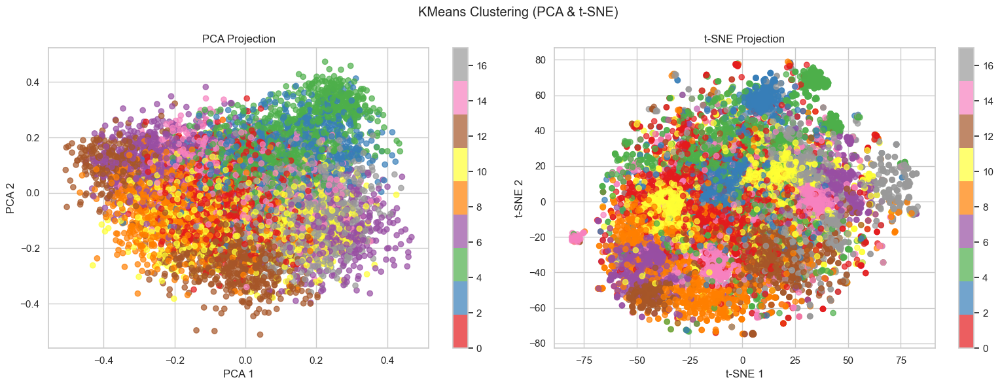

In [12]:
# Visualize the KMeans clustering results with PCA and t-SNE
plot_clusters(emb_norm, df_kmeans["cluster_kmeans"], title="KMeans Clustering (PCA & t-SNE)")

### Save DataFrame with KMeans Clusters

We now save the DataFrame that includes the original metadata and the KMeans cluster assignments.

In [13]:
output_path = "../data/kmeans_results.pkl"
df_kmeans.to_pickle(output_path)
print(f"DataFrame saved to: {output_path}")

excel_output_path = "../data/kmeans_results.xlsx"
with pd.ExcelWriter(excel_output_path, engine="xlsxwriter") as writer:
    df_kmeans.to_excel(writer, sheet_name="All_Clusters", index=False)
    for cluster_id, group in df_kmeans.groupby("cluster_kmeans"):
        sheet_name = f"Cluster_{cluster_id}"
        group.to_excel(writer, sheet_name=sheet_name, index=False)
print(f"Excel file saved to: {excel_output_path}")

DataFrame saved to: ../data/kmeans_results.pkl
Excel file saved to: ../data/kmeans_results.xlsx


# 3.4 Apply DBSCAN Clustering

We apply the DBSCAN clustering algorithm on the normalized embeddings.  
DBSCAN is a density-based clustering method that can automatically detect outliers (labelled as -1) and doesn’t require predefining the number of clusters.  
We set the parameters eps and min_samples based on empirical testing.

In [17]:
df_dbscan = df.copy()

In [14]:
@track_memory_and_time
def search_best_dbscan_params(X, min_samples_list, metric="silhouette"):
    """
    Try different min_samples values, estimate optimal eps using KneeLocator,
    evaluate DBSCAN, and return best parameters and summary dataframe.

    metric: 'silhouette' or 'db_index'
    """
    results = []

    for min_samples in min_samples_list:
        # Step 1: Compute k-distance plot
        neighbors = NearestNeighbors(n_neighbors=min_samples)
        neighbors_fit = neighbors.fit(X)
        distances, indices = neighbors_fit.kneighbors(X)
        k_distances = np.sort(distances[:, -1])  # distance to k-th neighbor

        # Step 2: KneeLocator to find eps
        kneedle = KneeLocator(range(1, len(k_distances) + 1), k_distances, S=1.0, curve="convex", direction="increasing")
        eps = kneedle.knee_y

        if eps is None:
            print(f"No clear knee found for min_samples={min_samples}. Skipping...")
            continue

        # Step 3: Run DBSCAN
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
        labels = dbscan.fit_predict(X)

        # Step 4: Evaluate only if enough clusters
        if len(set(labels)) > 1 and not (len(set(labels)) == 2 and -1 in labels):
            silhouette = silhouette_score(X, labels)
            db_index = davies_bouldin_score(X, labels)
        else:
            silhouette = None
            db_index = None

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = np.sum(labels == -1)

        results.append({
            "min_samples": min_samples,
            "eps": round(eps, 4),
            "n_clusters": n_clusters,
            "n_noise": n_noise,
            "silhouette": silhouette,
            "db_index": db_index
        })

    # Convert to DataFrame
    df_results = pd.DataFrame(results)

    # Find best row
    if not df_results.empty and metric in ["silhouette", "db_index"]:
        valid = df_results[df_results[metric].notna()]
        if not valid.empty:
            if metric == "silhouette":
                best_row = valid.loc[valid[metric].idxmax()]
            else:  # db_index
                best_row = valid.loc[valid[metric].idxmin()]

            eps_optimal = best_row["eps"]
            min_samples_optimal = best_row["min_samples"]
            print(f"\nBest DBSCAN parameters based on {metric}:")
            print(f"   ➤ eps = {eps_optimal}")
            print(f"   ➤ min_samples = {min_samples_optimal}")
        else:
            eps_optimal = None
            min_samples_optimal = None
            print("No valid clustering configurations for evaluation.")
    else:
        eps_optimal = None
        min_samples_optimal = None
        print("No results or invalid metric provided.")

    return df_results, eps_optimal, min_samples_optimal

In [15]:
min_samples_list = range(1,101)

In [16]:
df_dbscan_results, eps_optimal, min_samples_optimal = search_best_dbscan_params(emb_norm, min_samples_list=min_samples_list, metric="silhouette")
display(df_dbscan_results)


Best DBSCAN parameters based on silhouette:
   ➤ eps = 1.0618
   ➤ min_samples = 2.0
Time: 140.39 seconds | Peak memory: 2558.76 MB


,min_samples,eps,n_clusters,n_noise,silhouette,db_index
0,1,0.0000,10474,1,0.000191,2.780001e-08
1,2,1.0618,2,61,0.047416,4.628891e+00
2,3,1.0789,1,32,NaN,NaN
3,4,1.0874,1,24,NaN,NaN
4,5,1.0828,1,30,NaN,NaN
...,...,...,...,...,...,...
95,96,1.1730,1,0,NaN,NaN
96,97,1.1755,1,0,NaN,NaN
97,98,1.1679,1,0,NaN,NaN
98,99,1.1815,1,0,NaN,NaN


In [18]:
@track_memory_and_time
def run_dbscan_clustering(X, eps=0.5, min_samples=5):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
    labels = dbscan.fit_predict(X)
    return labels

# Run DBSCAN
dbscan_labels = run_dbscan_clustering(emb_norm, eps=eps_optimal, min_samples=int(min_samples_optimal))

# Assign to dataframe
df_dbscan["cluster_dbscan"] = dbscan_labels

# Check basic cluster stats
print("Number of clusters found (excluding noise):", len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0))
print("Number of noise points (label -1):", (dbscan_labels == -1).sum())
print(df_dbscan["cluster_dbscan"].value_counts().sort_index())

Time: 0.58 seconds | Peak memory: 33.16 MB
Number of clusters found (excluding noise): 2
Number of noise points (label -1): 61
cluster_dbscan
-1       61
 0    10413
 1        2
Name: count, dtype: int64


### Inspect DBSCAN Clusters

Let’s look at a few clusters found by **DBSCAN** and inspect some sample games from each cluster.  
We display the name, summary, genres, and platforms to evaluate the internal coherence of the clusters.  
Note that cluster -1 corresponds to **noise points**, i.e., games that were not assigned to any cluster.

In [19]:
inspect_clusters(df_dbscan, cluster_col="cluster_dbscan")

Cluster -1 — 61 games


,name,summary,genres,platforms
498,Ignis Dei,"Heralded by a comet, seen as a harbinger of do...","Adventure, Indie",PC (Microsoft Windows)
1271,Geezer Gus: The Meteorite Motel,The Meteorite Motel is a surreal JRPG based up...,Role-playing (RPG),PC (Microsoft Windows)
8896,Napoleon: Total War - The Peninsular Campaign,The Peninsular Campaign Downloadable Content i...,Strategy,"Mac, PC (Microsoft Windows)"
5779,Invasion: Family Ties,"Rick travels to Indiana to visit his mother, b...",Adventure,PC (Microsoft Windows)
3374,Millivolt,You play as an electrical appliance repair rob...,"Adventure, Indie, Platform, Puzzle, Strategy",PC (Microsoft Windows)


Cluster 0 — 10413 games


,name,summary,genres,platforms
958,Wave Break,Grab and grind to your heart's content in Wave...,"Arcade, Indie, Shooter, Simulator, Sport","Google Stadia, Linux, Nintendo Switch, PC (Mic..."
4748,Yello Bandana,"Well, there is only one character in this game...",Indie,PC (Microsoft Windows)
8391,Pixel Traffic: Risky Bridge,Drive your car and get to the end of the bridg...,"Indie, Racing","Linux, Mac, PC (Microsoft Windows)"
10394,Cyrah's Ascent,Cyrah's Ascent is a third-person combat game w...,"Adventure, Indie",PC (Microsoft Windows)
4827,My boss is weird,"""My boss is weird"" is a career AVG choice play...",Indie,PC (Microsoft Windows)


Cluster 1 — 2 games


,name,summary,genres,platforms
3981,FourChords Guitar Karaoke,"The fast, easy way to play the songs you love ...","Indie, Simulator","Mac, PC (Microsoft Windows)"
930,Mason and Strings,Mason needs Strings' help to learn how to play...,"Adventure, Indie","Mac, PC (Microsoft Windows)"


### Evaluate DBSCAN Clustering

We evaluate the **DBSCAN** clusters using two standard clustering quality metrics:

- **Silhouette Score**: Indicates how well-separated the clusters are. Higher is better. Range: [-1, 1]
- **Davies–Bouldin Index**: Measures intra-cluster similarity. Lower is better.

Keep in mind that **cluster -1** corresponds to noise (outliers), and is excluded from cluster quality evaluation.

In [20]:
evaluate_clustering(emb_norm, df_dbscan["cluster_dbscan"])

Silhouette Score: 0.0474
Davies–Bouldin Index: 4.6289


### Visualize DBSCAN Clustering

To better understand the structure of the DBSCAN clusters, we project the high-dimensional embeddings into 2D using both **PCA** and **t-SNE**.  
Each point is colored based on its assigned DBSCAN cluster.  
Note that points labeled as **-1** are considered outliers by DBSCAN and appear as a separate group.

Plot saved to: ../data/dbscan_clustering_(pca_&_t-sne).png


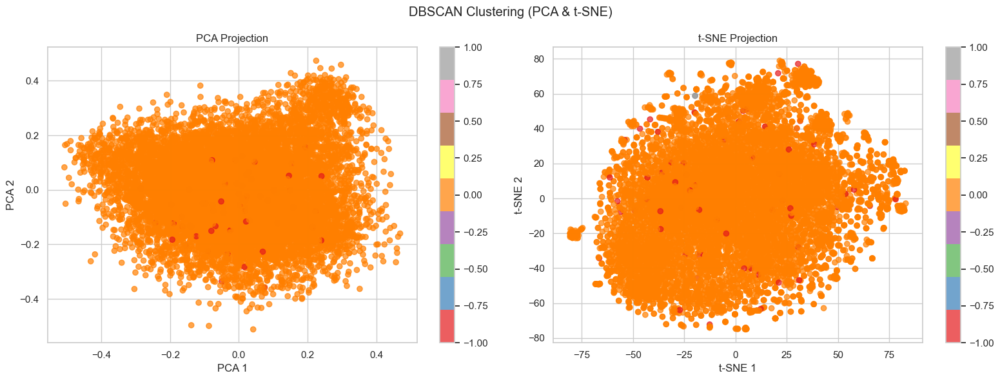

In [21]:
plot_clusters(emb_norm, df_dbscan["cluster_dbscan"], title="DBSCAN Clustering (PCA & t-SNE)")

### Save DataFrame with DBSCAN Clusters

We now save the DataFrame that includes the original metadata and the DBSCAN cluster assignments.

In [22]:
output_path = "../data/dbscan_results.pkl"
df_dbscan.to_pickle(output_path)
print(f"DataFrame saved to: {output_path}")

excel_output_path = "../data/dbscan_results.xlsx"
with pd.ExcelWriter(excel_output_path, engine="xlsxwriter") as writer:
    df_dbscan.to_excel(writer, sheet_name="All_Clusters", index=False)
    for cluster_id, group in df_dbscan.groupby("cluster_dbscan"):
        sheet_name = f"Cluster_{cluster_id}"
        group.to_excel(writer, sheet_name=sheet_name, index=False)
print(f"Excel file saved to: {excel_output_path}")

DataFrame saved to: ../data/dbscan_results.pkl
Excel file saved to: ../data/dbscan_results.xlsx


## 4. Purely Louvain Algorithm Implementation

In this notebook we apply the Louvain algorithm for community detection on a graph of video games. Each game is modeled as a node, and edges are weighted by the cosine similarity of their textual embeddings. To avoid very dense graphs, we keep only edges above a similarity threshold, so that connections reflect stronger semantic relationships (for example, in genre, narrative, or playstyle).

We explore different similarity thresholds and Louvain resolution parameters, which together control how the graph is constructed. For each configuration we compute quality metrics as modularity, Silhouette score, and Davies-Bouldin score; and combine them into a score that also takes into consideration the computational cost. We then inspect the resulting communities, also visually.

In [355]:
import numpy as np
import pandas as pd
import networkx as nx
from sklearn.metrics.pairwise import cosine_similarity
import time
import community as community_louvain
import tracemalloc
from sklearn.metrics import silhouette_score, davies_bouldin_score
import random
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [183]:
emb_norm = np.load("../data/embeddings_FINAL.npy") 
games_df = pd.read_pickle("../data/games_df_FINAL.pkl")

# print(emb_norm.shape)
# print(games_df.shape)

### 4.1 Construct Louvain's starting graph with weighted edges based in cosine similarity

In [184]:
# build a graph for a given threshold
def build_graph_from_sim(sim_matrix, threshold: float) -> nx.Graph:
    """
    Build an undirected graph where nodes are indices in sim_matrix
    and edges are added for similarities > threshold.
    """
    t0 = time.time()
    n = sim_matrix.shape[0]
    G = nx.Graph()
    G.add_nodes_from(range(n))

    # Vectorized: find all (i, j) with sim > threshold and i<j
    rows, cols = np.where(sim_matrix > threshold)
    mask = rows < cols
    rows, cols = rows[mask], cols[mask]

    for i, j in zip(rows, cols):
        G.add_edge(int(i), int(j), weight=float(sim_matrix[i, j]))
        
    print(
        f"Graph built: nodes={G.number_of_nodes()}, "
        f"edges={G.number_of_edges()}, "
        f"time={time.time() - t0:.2f}s"
    )

    return G

In [ ]:
# Create the cosine similarity matrix
t0 = time.time()
sim_matrix = cosine_similarity(emb_norm)
print("Cosine similarity done in:", time.time() - t0, "sec")

Cosine similarity done in: 1.0190174579620361 sec


### 4.2 Execute Louvain and analysis

#### 4.2.1 Code to run Louvain

In [ ]:
def evaluate_louvain(
    G: nx.Graph,
    embeddings: np.ndarray,
    resolution: float = 1.0,
    seed: int = 0,
) -> dict:
    """
    Run Louvain on graph G, compute:
    - modularity
    - #clusters, cluster sizes
    - silhouette, Davies-Bouldin on embeddings
    - runtime, peak memory
    Returns a dict of metrics.
    """
    # Measure memory + time
    tracemalloc.start()
    t0 = time.time()

    partition = community_louvain.best_partition(
        G,
        weight="weight",
        resolution=resolution,
        random_state=seed,
    )

    runtime = time.time() - t0
    current, peak = tracemalloc.get_traced_memory()
    tracemalloc.stop()
    peak_mb = peak / (1024 ** 2)

    # Partition -> labels array aligned with node indices
    # nodes are 0..N-1, same as rows in embeddings
    labels = np.array([partition[i] for i in range(len(partition))])
    n_clusters = len(np.unique(labels))

    # Cluster size stats
    cluster_sizes = pd.Series(labels).value_counts()
    largest_cluster = int(cluster_sizes.max())
    smallest_cluster = int(cluster_sizes.min())

    # Modularity
    modularity = community_louvain.modularity(partition, G, weight="weight")

    # Silhouette / DB on embeddings (only if >1 cluster and not all singletons)
    try:
        if n_clusters > 1 and largest_cluster > 1:
            sil = silhouette_score(embeddings, labels)
            db = davies_bouldin_score(embeddings, labels)
        else:
            sil = np.nan
            db = np.nan
    except Exception as e:
        print("Metric error:", e)
        sil = np.nan
        db = np.nan

    return {
        "resolution": resolution,
        "seed": seed,
        "n_clusters": n_clusters,
        "largest_cluster": largest_cluster,
        "smallest_cluster": smallest_cluster,
        "modularity": modularity,
        "silhouette": sil,
        "davies_bouldin": db,
        "runtime_sec": runtime,
        "peak_mem_mb": peak_mb,
    }, partition


#### 4.2.2 Grid search of best configuration for Louvain with different thresholds and resolutions

In [194]:
thresholds = [0.4, 0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
resolutions = [0.5, 1.0, 1.5]
seeds = [0]

results = []
partitions_cache = {}  # key: (thr, res, seed) -> partition

for thr in thresholds:
    print(f"\n=== Threshold {thr} ===")
    G_thr = build_graph_from_sim(sim_matrix, thr)
    
    for res in resolutions:
        for seed in seeds:
            print(f"  -> Louvain: res={res}, seed={seed}")
            metrics, partition = evaluate_louvain(
                G_thr,
                emb_norm,
                resolution=res,
                seed=seed,
            )
            metrics_with_thr = {"threshold": thr, **metrics}
            results.append(metrics_with_thr)
            partitions_cache[(thr, res, seed)] = partition

results_df = pd.DataFrame(results)


=== Threshold 0.4 ===
Graph built: nodes=10476, edges=3010936, time=8.13s
  -> Louvain: res=0.5, seed=0
  -> Louvain: res=1.0, seed=0
  -> Louvain: res=1.5, seed=0

=== Threshold 0.5 ===
Graph built: nodes=10476, edges=426116, time=2.97s
  -> Louvain: res=0.5, seed=0
  -> Louvain: res=1.0, seed=0
  -> Louvain: res=1.5, seed=0

=== Threshold 0.6 ===
Graph built: nodes=10476, edges=63942, time=0.58s
  -> Louvain: res=0.5, seed=0
  -> Louvain: res=1.0, seed=0
  -> Louvain: res=1.5, seed=0

=== Threshold 0.65 ===
Graph built: nodes=10476, edges=27442, time=0.63s
  -> Louvain: res=0.5, seed=0
  -> Louvain: res=1.0, seed=0
  -> Louvain: res=1.5, seed=0

=== Threshold 0.7 ===
Graph built: nodes=10476, edges=11714, time=0.40s
  -> Louvain: res=0.5, seed=0
  -> Louvain: res=1.0, seed=0
  -> Louvain: res=1.5, seed=0

=== Threshold 0.75 ===
Graph built: nodes=10476, edges=5075, time=0.40s
  -> Louvain: res=0.5, seed=0
  -> Louvain: res=1.0, seed=0
  -> Louvain: res=1.5, seed=0

=== Threshold 0.8

In [279]:
results_df

,threshold,resolution,seed,n_clusters,largest_cluster,smallest_cluster,modularity,silhouette,davies_bouldin,runtime_sec,peak_mem_mb
0,0.40,0.5,0,357,6261,1,0.189876,-0.092461,1.234882,90.096862,759.169371
1,0.40,1.0,0,20,3262,1,0.284516,0.017489,1.969184,214.781497,758.755286
2,0.40,1.5,0,42,1954,1,0.260726,-0.105735,2.196742,217.446539,758.884832
3,0.50,0.5,0,931,4816,1,0.446915,-0.048380,1.255729,16.582748,112.161957
4,0.50,1.0,0,597,3176,1,0.483272,-0.077570,1.048565,81.297353,112.185759
5,0.50,1.5,0,602,2082,1,0.467201,-0.064767,1.088848,35.234539,112.235258
6,0.60,0.5,0,4721,1036,1,0.611312,0.006275,1.025748,4.397286,22.946995
7,0.60,1.0,0,4263,1634,1,0.643320,-0.051444,1.001206,14.595705,25.418089
8,0.60,1.5,0,4282,1415,1,0.668266,-0.042392,1.002264,10.848536,24.227509
9,0.65,0.5,0,6890,344,1,0.695213,0.028671,0.871856,7.333801,14.251883


#### 4.2.3 Ranking configurations with custom made metric-weights

In [338]:
df = results_df.copy()

# Filter out obviously bad clusterings
lower_bound, upper_bound = 3, 10000
df = df[(df["n_clusters"] >= lower_bound) & (df["n_clusters"] <= upper_bound)]

# Normalize metrics we want to maximize
for col in ["modularity", "silhouette"]:
    valid = df[col].replace([np.inf, -np.inf], np.nan)
    if valid.nunique() > 1:
        df[col + "_norm"] = (valid - valid.min()) / (valid.max() - valid.min())
    else:
        df[col + "_norm"] = 0.5  # neutral

# Normalize metrics we want to minimize (invert)
for col in ["davies_bouldin", "runtime_sec", "peak_mem_mb"]:
    valid = df[col].replace([np.inf, -np.inf], np.nan)
    if valid.nunique() > 1:
        df[col + "_norm"] = (valid.max() - valid) / (valid.max() - valid.min())
    else:
        df[col + "_norm"] = 0.5

# Weighted score (chosen a little bit at random)
df["score"] = (
    0.25 * df["modularity_norm"] +       
    0.15 * df["silhouette_norm"] +      
    0.25 * df["davies_bouldin_norm"] +  
    0.20 * df["runtime_sec_norm"] +     
    0.15 * df["peak_mem_mb_norm"]
)

best_configs = df.sort_values("score", ascending=False)
best_configs.head(10)


,threshold,resolution,seed,n_clusters,largest_cluster,smallest_cluster,modularity,silhouette,davies_bouldin,runtime_sec,peak_mem_mb,modularity_norm,silhouette_norm,davies_bouldin_norm,runtime_sec_norm,peak_mem_mb_norm,score
20,0.80,1.5,0,9629,65,1,0.924442,0.024737,0.574254,5.062631,13.137589,0.998990,0.946061,0.999851,0.992858,0.994388,0.989349
19,0.80,1.0,0,9627,65,1,0.925185,0.024118,0.574099,4.967430,13.136924,1.000000,0.941573,0.999947,0.993303,0.994389,0.989042
18,0.80,0.5,0,9625,65,1,0.924431,0.023303,0.574012,4.574875,13.133413,0.998974,0.935669,1.000000,0.995138,0.994394,0.988281
15,0.75,0.5,0,9187,98,1,0.844649,0.032175,0.586696,3.534927,8.927275,0.890473,1.000000,0.992184,1.000000,1.000000,0.970664
16,0.75,1.0,0,9126,120,1,0.872528,0.025690,0.632247,5.114580,13.652656,0.928387,0.952971,0.964113,0.992615,0.993702,0.963649
17,0.75,1.5,0,9128,106,1,0.871274,0.026306,0.631011,5.680870,13.658901,0.926682,0.957438,0.964875,0.989968,0.993693,0.963552
12,0.70,0.5,0,8267,269,1,0.790434,0.023601,0.785870,4.795194,12.763762,0.816742,0.937827,0.869444,0.994108,0.994886,0.910275
13,0.70,1.0,0,8264,249,1,0.791026,0.022789,0.830461,6.642969,17.333029,0.817547,0.931937,0.841965,0.985470,0.988796,0.900082
14,0.70,1.5,0,8266,171,1,0.782049,0.023898,0.830847,6.951830,17.344870,0.805338,0.939983,0.841727,0.984027,0.988780,0.897886
9,0.65,0.5,0,6890,344,1,0.695213,0.028671,0.871856,7.333801,14.251883,0.687245,0.974586,0.816455,0.982241,0.992903,0.867496


##### 4.2.4 Visual comparison of Silhouette vs. Resolution and Silhouette vs. Runtime

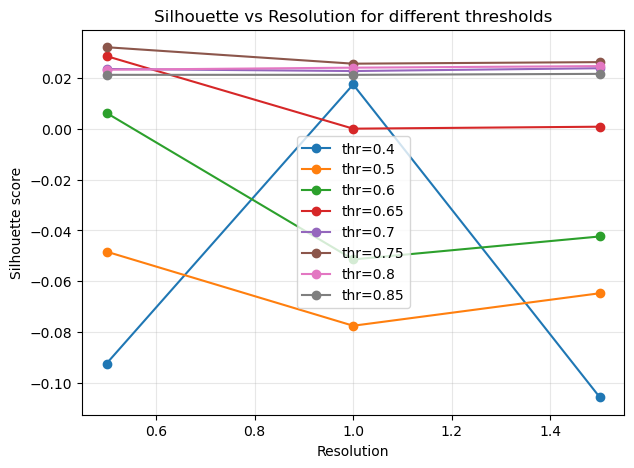

In [211]:
plt.figure(figsize=(7,5))
for thr in thresholds:
    sub = results_df[results_df["threshold"] == thr]
    sub_sorted = sub.sort_values("resolution")
    plt.plot(sub_sorted["resolution"], sub_sorted["silhouette"], marker="o", label=f"thr={thr}")
plt.xlabel("Resolution")
plt.ylabel("Silhouette score")
plt.title("Silhouette vs Resolution for different thresholds")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


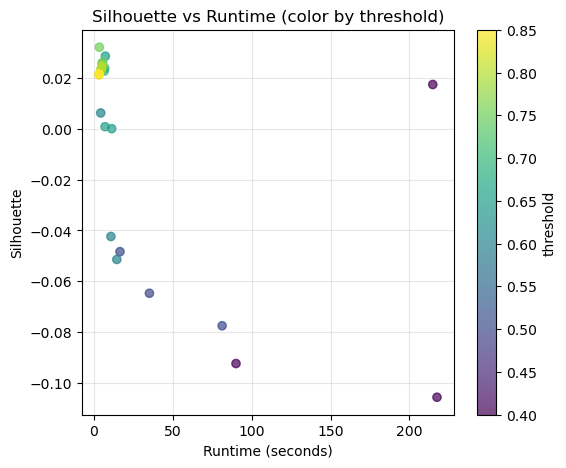

In [212]:
plt.figure(figsize=(6,5))
plt.scatter(results_df["runtime_sec"], results_df["silhouette"], c=results_df["threshold"], cmap="viridis", alpha=0.7)
plt.xlabel("Runtime (seconds)")
plt.ylabel("Silhouette")
plt.title("Silhouette vs Runtime (color by threshold)")
plt.colorbar(label="threshold")
plt.grid(True, alpha=0.3)
plt.show()

#### 4.2.5 Selection of best result based on custom made score

In [339]:
row = best_configs.iloc[0]
thr_best = row["threshold"]
res_best = row["resolution"]
seed_best = int(row["seed"])

print("Best config:", thr_best, res_best, seed_best)

# Get partition for that config
best_partition = partitions_cache[(thr_best, res_best, seed_best)]
labels_best = np.array([best_partition[i] for i in range(len(best_partition))])

Best config: 0.8 1.5 0


### 4.3 Analysis of the best Louvain

#### 4.3.1 Check the cluster sizes

In [340]:
cluster_sizes = Counter(best_partition.values())
print("Cluster size distribution:")

for cluster_id, size in cluster_sizes.most_common():
    print(f"Cluster {cluster_id}: {size} games")

Cluster size distribution:
Cluster 1315: 65 games
Cluster 190: 55 games
Cluster 69: 36 games
Cluster 593: 30 games
Cluster 787: 28 games
Cluster 414: 22 games
Cluster 2029: 22 games
Cluster 264: 21 games
Cluster 355: 21 games
Cluster 1658: 19 games
Cluster 185: 17 games
Cluster 196: 17 games
Cluster 169: 16 games
Cluster 1607: 16 games
Cluster 2855: 12 games
Cluster 3312: 11 games
Cluster 3891: 11 games
Cluster 130: 10 games
Cluster 225: 10 games
Cluster 4987: 10 games
Cluster 571: 9 games
Cluster 1411: 9 games
Cluster 686: 8 games
Cluster 2271: 8 games
Cluster 4733: 7 games
Cluster 427: 6 games
Cluster 1490: 6 games
Cluster 119: 5 games
Cluster 176: 5 games
Cluster 259: 5 games
Cluster 266: 5 games
Cluster 960: 5 games
Cluster 1259: 5 games
Cluster 2152: 5 games
Cluster 2325: 5 games
Cluster 2602: 5 games
Cluster 2982: 5 games
Cluster 3578: 5 games
Cluster 70: 4 games
Cluster 208: 4 games
Cluster 329: 4 games
Cluster 434: 4 games
Cluster 766: 4 games
Cluster 1040: 4 games
Cluster 1047

#### 4.3.2 Check average intra-cluster similarity

In [341]:
def average_intra_cluster_similarity(sim_matrix, partition):
    clusters = {}
    for node, cid in partition.items():
        clusters.setdefault(cid, []).append(node)

    intra_sims = {}

    for cid, nodes in clusters.items():
        if len(nodes) < 2:
            intra_sims[cid] = 0
            continue

        sims = []
        for i in range(len(nodes)):
            for j in range(i + 1, len(nodes)):
                sims.append(sim_matrix[nodes[i], nodes[j]])

        intra_sims[cid] = np.mean(sims)

    return intra_sims

In [342]:
intra = average_intra_cluster_similarity(sim_matrix, best_partition)

print("\nAverage intra-cluster similarity:")
for cid, sim in sorted(intra.items(), key=lambda x: -x[1])[:10]:
    print(f"Cluster {cid}: {sim:.4f}")


Average intra-cluster similarity:
Cluster 5985: 1.0000
Cluster 4831: 0.9995
Cluster 6743: 0.9930
Cluster 4999: 0.9877
Cluster 5035: 0.9876
Cluster 1490: 0.9840
Cluster 5754: 0.9819
Cluster 4841: 0.9806
Cluster 4408: 0.9774
Cluster 3625: 0.9715


#### 4.3.2 Plot of a scatter map of the comunities 

In [343]:
# This may take a while if there are many nodes
X_2d = TSNE(
    n_components=2,
    init="random",
    learning_rate="auto",
    perplexity=30,
    max_iter=1000,
    verbose=1,
    ).fit_transform(emb_norm)

def plot_partition_2d(labels, title=""):
    plt.figure(figsize=(7,6))
    plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, s=3, cmap="tab20")
    plt.title(title)
    plt.axis("off")
    plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10476 samples in 0.005s...
[t-SNE] Computed neighbors for 10476 samples in 1.369s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10476
[t-SNE] Computed conditional probabilities for sample 2000 / 10476
[t-SNE] Computed conditional probabilities for sample 3000 / 10476
[t-SNE] Computed conditional probabilities for sample 4000 / 10476
[t-SNE] Computed conditional probabilities for sample 5000 / 10476
[t-SNE] Computed conditional probabilities for sample 6000 / 10476
[t-SNE] Computed conditional probabilities for sample 7000 / 10476
[t-SNE] Computed conditional probabilities for sample 8000 / 10476
[t-SNE] Computed conditional probabilities for sample 9000 / 10476
[t-SNE] Computed conditional probabilities for sample 10000 / 10476
[t-SNE] Computed conditional probabilities for sample 10476 / 10476
[t-SNE] Mean sigma: 0.253180
[t-SNE] KL divergence after 250 iterations with early exaggeration: 95.647697
[t-SNE] KL 

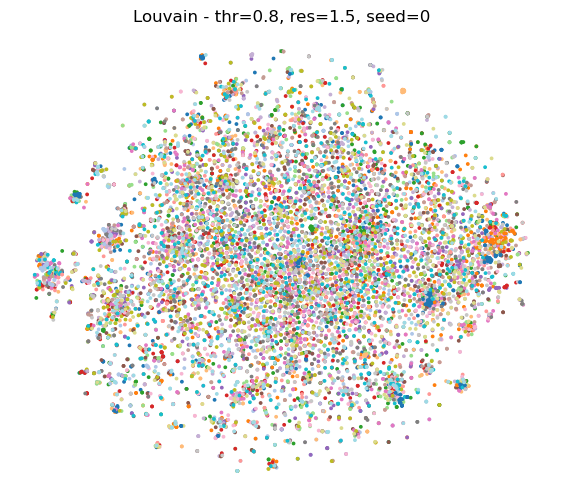

In [344]:
plot_partition_2d(labels_best, title=f"Louvain - thr={thr_best}, res={res_best}, seed={seed_best}")

##### 4.3.2.a Plot the top clusters

In [345]:
def plot_top_clusters(X_2d, labels, top_k=15, title="Louvain communities"):
    cluster_sizes = pd.Series(labels).value_counts()
    top_clusters = cluster_sizes.head(top_k).index

    # map top cluster ids -> 0..top_k-1
    color_map = {cid: i for i, cid in enumerate(top_clusters)}
    colors = np.full_like(labels, fill_value=-1, dtype=int)

    for cid in top_clusters:
        colors[labels == cid] = color_map[cid]

    plt.figure(figsize=(8, 7))
    # background: all points in light gray
    plt.scatter(X_2d[:, 0], X_2d[:, 1], c="lightgray", s=2, alpha=0.2)

    # highlight: only top clusters
    mask = colors >= 0
    sc = plt.scatter(
        X_2d[mask, 0],
        X_2d[mask, 1],
        c=colors[mask],
        s=6,
        cmap="tab20",
        alpha=0.9,
    )
    plt.title(f"{title} (top {top_k} clusters)")
    plt.axis("off")
    plt.show()


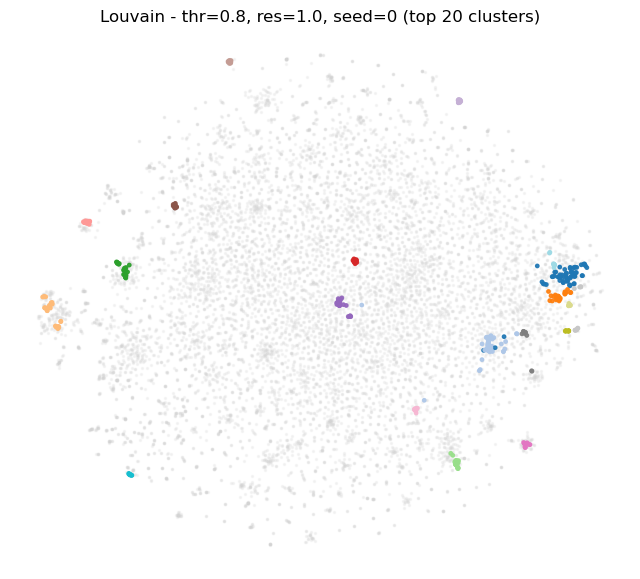

In [346]:
plot_top_clusters(X_2d, labels_best, top_k=20, title="Louvain - thr=0.8, res=1.0, seed=0")

##### 4.3.2.b Plot and inspect a single cluster

In [347]:
def plot_single_community(cluster_id, X_2d, labels, title_prefix="Cluster"):
    mask = labels == cluster_id

    plt.figure(figsize=(8, 7))
    # all nodes in light gray
    plt.scatter(X_2d[:, 0], X_2d[:, 1], c="lightgray", s=2, alpha=0.2)
    # selected cluster in color
    plt.scatter(X_2d[mask, 0], X_2d[mask, 1], c="red", s=6, alpha=0.9)
    plt.title(f"{title_prefix} {cluster_id} (size={mask.sum()})")
    plt.axis("off")
    plt.show()

In [348]:
def inspect_cluster(cluster_id, df, partition, n=30):
    # node ids from Louvain partition
    node_ids = [i for i, c in partition.items() if c == cluster_id]

    # keep only ids that are valid row positions in df
    valid_ids = [i for i in node_ids if 0 <= i < len(df)]
    dropped = len(node_ids) - len(valid_ids)
    if dropped > 0:
        print(f"Warning: dropped {dropped} nodes not in [0, {len(df)-1}]")

    if not valid_ids:
        print(f"No nodes from cluster {cluster_id} are present in the current df.")
        return

    # now this can't be out-of-bounds
    df_cluster = df.iloc[valid_ids]

    print(f"Cluster {cluster_id} - size={len(df_cluster)}\n")

    # Top genres (adapt column name if needed)
    if "genres" in df_cluster.columns:
        print("Top genres:")
        print(df_cluster["genres"].value_counts().head(10))
        print()

    # Top platforms, if present
    for col in ["platforms", "platform", "main_platform"]:
        if col in df_cluster.columns:
            print(f"Top {col}:")
            print(df_cluster[col].value_counts().head(10))
            print()
            break

    print("Sample games:")
    cols = [c for c in ["game_id", "name", "genres"] if c in df_cluster.columns]
    display(df_cluster[cols].head(n))


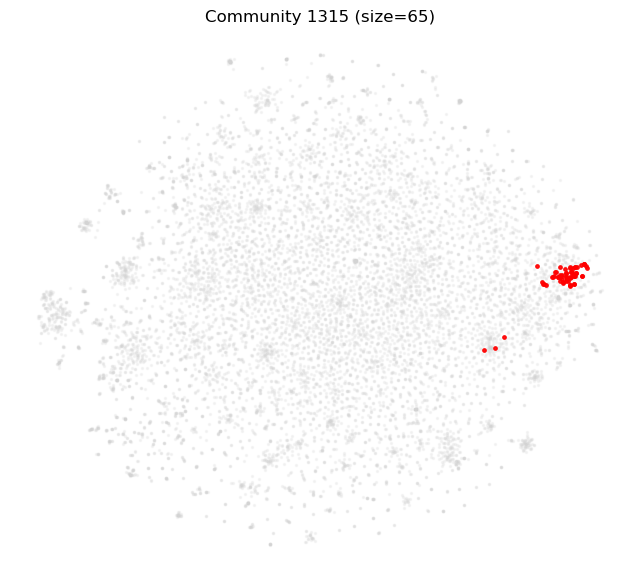

Cluster 1315 - size=65

Top genres:
genres
Indie                                              23
Indie, Puzzle                                       8
Indie, Strategy                                     7
Indie, Role-playing (RPG), Simulator                6
Puzzle                                              3
Indie, Simulator                                    3
Adventure, Indie, Simulator                         3
Simulator                                           3
Adventure, Indie, Role-playing (RPG), Simulator     2
Strategy                                            2
Name: count, dtype: int64

Top platforms:
platforms
PC (Microsoft Windows)                62
Linux, Mac, PC (Microsoft Windows)     2
Linux, PC (Microsoft Windows)          1
Name: count, dtype: int64

Sample games:


,game_id,name,genres
171,326234,Hentai World Halloween,Indie
1134,286442,Hentai Cosplay Elf,Indie
1284,311810,Hentai Girls Nature,Indie
1348,340464,Hentai World Winter,Indie
1370,349956,Hentai World Bunny,Indie
1686,241386,Hentai Pool,"Indie, Strategy"
1710,163535,Hentai Girls 18+,"Indie, Simulator"
1885,286739,Easy Hentai Puzzle 2,"Indie, Puzzle"
2046,271032,Hentai Ancient Secret,Indie
2124,171664,Hentai Princess,"Adventure, Indie, Role-playing (RPG), Simulator"


In [349]:
cluster_sizes = pd.Series(labels_best).value_counts()

cluster_id = int(cluster_sizes.index[0])  # largest cluster, for example
plot_single_community(cluster_id, X_2d, labels_best, title_prefix="Community")
inspect_cluster(cluster_id, games_df, best_partition)


#### 4.3.3 Check the top genres of the clusters

In [350]:
def cluster_top_genre(df, labels, max_clusters=50):
    df_tmp = df.copy()
    df_tmp["cluster"] = labels

    rows = []
    for cid, grp in df_tmp.groupby("cluster"):
        if len(rows) >= max_clusters:
            break
        if "genres" not in grp.columns:
            continue
        top_genre = grp["genres"].value_counts().idxmax()
        genre_share = grp["genres"].value_counts(normalize=True).iloc[0]
        rows.append({
            "cluster": cid,
            "size": len(grp),
            "top_genre": top_genre,
            "top_genre_share": genre_share,
        })

    return pd.DataFrame(rows).sort_values("size", ascending=False)

top_genres_per_cluster = cluster_top_genre(games_df, labels_best, max_clusters=len(np.unique(labels_best)))
top_genres_per_cluster.head(10)


,cluster,size,top_genre,top_genre_share
1315,1315,65,Indie,0.353846
190,190,55,Indie,0.763636
69,69,36,Indie,0.638889
593,593,30,Simulator,1.000000
787,787,28,Simulator,1.000000
414,414,22,Indie,0.409091
2029,2029,22,"Adventure, Indie, Racing, Role-playing (RPG), ...",0.863636
355,355,21,"Adventure, Role-playing (RPG)",0.333333
264,264,21,Fighting,0.428571
1658,1658,19,"Adventure, Role-playing (RPG), Simulator, Stra...",0.789474


### 4.4 Recommender with the best Louvain

In [351]:
_partition_cache = None
_graph_cache = None

def louvain_recommender(game_id, embeddings_norm, topk=10):

    global _partition_cache, _graph_cache

    # Load partition
    if _partition_cache is None:
        print("Loading Louvain partition...")
        with open("partition_louvain_puro.pkl", "rb") as f:
            _partition_cache = pickle.load(f)

    # Load graph
    if _graph_cache is None:
        print("Loading Louvain graph...")
        with open("graph_louvain_puro.pkl", "rb") as f:
            _graph_cache = pickle.load(f)

    partition = _partition_cache
    G = _graph_cache
    cluster_id = partition[game_id]
    same_cluster = [
        j for j, c in partition.items()
        if c == cluster_id and j != game_id
    ]

    if len(same_cluster) == 0:
        print("Game is isolated; no recommendations.")
        return []

    sims = [
        (j, float(np.dot(embeddings_norm[game_id], embeddings_norm[j])))
        for j in same_cluster
    ]

    sims.sort(key=lambda x: x[1], reverse=True)
    return sims[:topk]

In [363]:
nodes_in_top = np.where(labels_best == cluster_id)[0].tolist()
random_node = random.choice(nodes_in_top)

base_row = games_df.iloc[random_node]
game_id = int(base_row["game_id"])
print(f"Base game: {base_row['name']} (game_id={game_id}):")

# pass the node index to the recommender so it matches the partition keys
recs = louvain_recommender(random_node, emb_norm)
for idx, sim in recs:
    print(f"  {games_df.iloc[idx]['name']} - similarity = {sim:.3f}")

Base game: Hentai Girls Nature (game_id=311810):
  Hentai Girls - similarity = 0.889
  Hentai Two Girls - similarity = 0.835
  Hentai World Winter - similarity = 0.832
  Hentai Journey - similarity = 0.829
  Hentai World Halloween - similarity = 0.820
  Hentai Girls Maid - similarity = 0.805
  Hentai: Ultimate Puzzle - similarity = 0.804
  Easy Hentai Puzzle 2 - similarity = 0.803
  Hentai Cool Girls - similarity = 0.802
  Hentai Crazy Girls - similarity = 0.801


# 5. LSH-Louvain
This notebooks implements a hybrid approach combining LSH and Louvain, so that that tha advantages of each method can be maximized while minimizing their limitations.

In [136]:
# Imports

import pandas as pd
from sentence_transformers import SentenceTransformer
import numpy as np
from collections import defaultdict
from sklearn.metrics.pairwise import cosine_similarity
import re
import time
import tracemalloc

import networkx as nx
import community as community_louvain
from sklearn.metrics import davies_bouldin_score
import pickle


# Load precomputed dataframe + embeddings
df = pd.read_pickle("games_df.pkl")
embeddings = np.load("embeddings.npy")

print("Embeddings shape:", embeddings.shape)
print("Number of games:", len(df))


Embeddings shape: (10476, 384)
Number of games: 10476


## Generate random hyperplanes

In [137]:
def generate_hyperplanes(num_tables, num_planes, dim, seed= 0):
    rng = np.random.RandomState(seed)
    hyperplanes = []
    for _ in range(num_tables):
        planes = rng.randn(num_planes, dim)
        planes /= np.linalg.norm(planes, axis = 1, keepdims = True) +1e-9
        hyperplanes.append(planes)
    
    return hyperplanes

# check it
dim = embeddings.shape[1]
num_tables = 10
num_planes = 16

hyperplanes = generate_hyperplanes(num_tables, num_planes, dim, seed=33)
print(hyperplanes)

[array([[-0.01636433, -0.0822688 , -0.07879106, ..., -0.03037444,
         0.02857754,  0.05055213],
       [ 0.04226748,  0.01131865, -0.00684458, ..., -0.00090081,
        -0.04132469,  0.03906224],
       [ 0.00036863, -0.00614149, -0.0029053 , ..., -0.02039806,
        -0.06660375, -0.00144424],
       ...,
       [-0.02160066,  0.00627249,  0.05156927, ...,  0.04815518,
         0.03370179, -0.03259623],
       [-0.16762874,  0.01323529,  0.035048  , ...,  0.07726289,
         0.00270281,  0.01887253],
       [ 0.00026104,  0.00025794,  0.05709854, ..., -0.07947919,
         0.00487741,  0.00843518]], shape=(16, 384)), array([[ 0.01588397,  0.08047979, -0.00158552, ...,  0.00705402,
         0.04997843,  0.02041587],
       [ 0.01394603, -0.08109805, -0.02365737, ..., -0.12642717,
        -0.02261045,  0.05341474],
       [-0.05057007,  0.06450797,  0.05145814, ..., -0.04600032,
         0.03888609, -0.01980033],
       ...,
       [-0.02351672, -0.00966409, -0.03954437, ...,  0.0

## Hash each embedding into buckets 

In [138]:
def hash_v(v, planes):
    projections = planes @ v
    bits = projections > 0
    key = ''.join('1' if b else '0' for b in bits)
    return key


## Get LSH index, which is tables with buckets

In [139]:
# Get LSH index, which is tables with buckets

def build_lsh_idx(embeddings, hyperplanes):
    n, dim = embeddings.shape
    num_tables = len(hyperplanes)

    tables = [defaultdict(set) for _ in range(num_tables)]

    for idx, v in enumerate(embeddings):
        for t, planes in enumerate(hyperplanes):
            key = hash_v(v, planes)
            tables[t][key].add(idx)
    
    return tables

# build it
tables = build_lsh_idx(embeddings, hyperplanes)
print("Built LSH tables.")


Built LSH tables.


## Get candidate neighbours for a game

In [140]:
def lsh_query(idx, embeddings, hyperplanes, tables):
    v = embeddings[idx]
    candidates = set()

    for t, planes in enumerate(hyperplanes):
        key = hash_v(v, planes)
        bucket = tables[t].get(key, set())
        candidates |= bucket

    candidates.discard(idx)
    return candidates

# quick test
cand = lsh_query(0, embeddings, hyperplanes, tables)
print("Candidates for game 0:", len(cand))
for candidate in list(cand)[:10]:
    print(df.loc[candidate, 'name'])


Candidates for game 0: 23
Trine 2: Goblin Menace
Rake Remastered
Total War: Shogun 2 - Fall of the Samurai: The Saga Faction Pack
DNF Duel: Season Pass
Lords of the Fallen: The Foundation Boost
Tri.Defender
Injustice 2: Reverse Flash
Deep Space Scoundrel
Quake III: Team Arena
Running into the Cyberpunk


## LSH Recommender (from section 3.2.2)

In [141]:
# Rank candidates by cosine similarity + rating + recency
def recommend_lsh_embedding(idx, embeddings, hyperplanes, tables, df, top=5):
    v = embeddings[idx]
    cand = lsh_query(idx, embeddings, hyperplanes, tables)

    if not cand:
        print(f"No candidates for {df.loc[idx, 'name']}")
        return []

    cand_indices = np.array(list(cand), dtype=int)

    sim = cosine_similarity(
        v.reshape(1, -1),
        embeddings[cand_indices]
    )  # shape: (1, n_candidates)

    sim_flat = sim[0]  
    cos_norm = (sim_flat + 1.0) / 2.0

    ratings = df.loc[cand_indices, 'steam_rating'].astype(float).to_numpy()
    recency = df.loc[cand_indices, 'recency'].astype(float).to_numpy()

    w_sim = 0.7
    w_rating = 0.2
    w_date = 0.1

    final_score = (w_sim*cos_norm + w_rating*ratings + w_date*recency)
    
    order = np.argsort(final_score)[::-1]
    ordered_indices = cand_indices[order]
    ordered_cos_norm = cos_norm[order]    
    ordered_rating = ratings[order]
    ordered_recency = recency[order]
    ordered_score = final_score[order]

    results = list(zip(
        ordered_indices[:top], 
        ordered_cos_norm[:top],
        ordered_rating[:top],
        ordered_recency[:top],
        ordered_score[:top]))

    print(f"Query: {df.loc[idx, 'name']}")
    print("Recommendations (cosine_norm, rating, recency, score):")

    for j, cos_s, r, rec, score in results:
        print(
            f" --> {df.loc[j, 'name']} "
            f"(cos={cos_s:.3f}, rating={r:.3f}, recency = {rec:.3f}, score={score:.3f})"
        )

    return results

# test LSH-only recommender
recommend_lsh_embedding(0, embeddings, hyperplanes, tables, df, top=3)


Query: Hunter Hitman
Recommendations (cosine_norm, rating, recency, score):
 --> Running into the Cyberpunk (cos=0.677, rating=1.000, recency = 0.941, score=0.768)
 --> Scratch Man (cos=0.681, rating=0.923, recency = 0.955, score=0.757)
 --> Freebooter of Splorr!! (cos=0.654, rating=1.000, recency = 0.919, score=0.750)


[(np.int64(10144),
  np.float32(0.6766021),
  np.float64(1.0),
  np.float64(0.9410124943999204),
  np.float64(0.7677227370574846)),
 (np.int64(6376),
  np.float32(0.6806127),
  np.float64(0.9230769231),
  np.float64(0.9554482552640748),
  np.float64(0.7565890765328211)),
 (np.int64(9205),
  np.float32(0.6544188),
  np.float64(1.0),
  np.float64(0.9187117327890886),
  np.float64(0.7499643396302271))]

### Cosine similarity matrix 

In [142]:
t0_sim = time.perf_counter()
sim_matrix = cosine_similarity(embeddings)
print("Cosine similarity matrix computed in:", time.perf_counter() - t0_sim, "sec")


Cosine similarity matrix computed in: 0.7867610930006776 sec


## Build a similarity graph using LSH candidates

In [143]:
def build_graph_from_lsh(embeddings, hyperplanes, tables, sim_matrix, threshold=0.8):
    """
    Build an undirected graph:

    - Node: game index
    - Edge (i, j): if j is in LSH candidates of i and sim_matrix[i, j] >= threshold
    - Edge weight: cosine similarity from sim_matrix
    """
    n = embeddings.shape[0]
    G = nx.Graph()
    G.add_nodes_from(range(n))

    seen_edges = set()  # avoid duplicates

    for i in range(n):
        cand = list(lsh_query(i, embeddings, hyperplanes, tables))
        if not cand:
            continue

        cand = np.array(cand, dtype=int)

        # vectorized: all similarities from row i to its candidates
        sims = sim_matrix[i, cand]

        # keep only candidates above threshold
        mask = sims >= threshold
        cand_kept = cand[mask]
        sims_kept = sims[mask]

        for j, sim_ij in zip(cand_kept, sims_kept):
            if j == i:
                continue
            a, b = (i, j) if i < j else (j, i)
            if (a, b) in seen_edges:
                continue

            G.add_edge(int(a), int(b), weight=float(sim_ij))
            seen_edges.add((a, b))

    print(
        f"LSH graph built: nodes={G.number_of_nodes()}, "
        f"edges={G.number_of_edges()}"
    )
    return G

# example: build graph with some threshold
threshold = 0.7
G_lsh = build_graph_from_lsh(embeddings, hyperplanes, tables, sim_matrix, threshold=threshold)


LSH graph built: nodes=10476, edges=2336


## Evaluate Louvain

In [144]:
def evaluate_louvain(
    G: nx.Graph,
    embeddings: np.ndarray,
    resolution: float = 1.0,
    seed: int = 0,
) -> dict:
    """
    Run Louvain on graph G, compute:
    - modularity
    - #clusters, cluster sizes
    - silhouette, Davies-Bouldin on embeddings
    - runtime, peak memory
    Returns a dict of metrics.
    """
    # Measure memory + time
    tracemalloc.start()
    t0_local = time.time()

    partition = community_louvain.best_partition(
        G,
        weight="weight",
        resolution=resolution,
        random_state=seed,
    )

    runtime = time.time() - t0_local
    current, peak = tracemalloc.get_traced_memory()
    tracemalloc.stop()
    peak_mb = peak / (1024 ** 2)

    labels = np.array([partition[i] for i in range(len(partition))])
    n_clusters = len(np.unique(labels))

    cluster_sizes = pd.Series(labels).value_counts()
    largest_cluster = int(cluster_sizes.max())
    smallest_cluster = int(cluster_sizes.min())

    modularity = community_louvain.modularity(partition, G, weight="weight")

    try:
        if n_clusters > 1 and largest_cluster > 1:
            db = davies_bouldin_score(embeddings, labels)
        else:
            db = np.nan
    except Exception as e:
        print("Metric error:", e)
        db = np.nan

    return {
        "resolution": resolution,
        "seed": seed,
        "n_clusters": n_clusters,
        "largest_cluster": largest_cluster,
        "smallest_cluster": smallest_cluster,
        "modularity": modularity,
        "davies_bouldin": db,
        "runtime_sec": runtime,
        "peak_mem_mb": peak_mb,
    }, partition


## # Run Louvain on the LSH-derived graph

In [145]:
resolution = 1.5
seed = 0

metrics_lsh, partition_lsh = evaluate_louvain(G_lsh, embeddings, resolution=resolution, seed=seed)

print("Louvain on LSH-graph metrics:")
for k, v in metrics_lsh.items():
    print(f"{k}: {v}")

# Save LSH-Louvain partition and graph
with open("partition_louvain_lsh.pkl", "wb") as f:
    pickle.dump(partition_lsh, f)

with open("graph_louvain_lsh.pkl", "wb") as f:
    pickle.dump(G_lsh, f)

print("Saved LSH-Louvain partition and graph.")


Louvain on LSH-graph metrics:
resolution: 1.5
seed: 0
n_clusters: 9448
largest_cluster: 82
smallest_cluster: 1
modularity: 0.8663734158237371
davies_bouldin: 0.6354720344927514
runtime_sec: 3.4662363529205322
peak_mem_mb: 12.988666534423828
Saved LSH-Louvain partition and graph.


## Hybrid LSH + Louvain recommender

In [146]:
_lsh_louvain_partition_cache = None

def load_lsh_louvain_partition(path="partition_louvain_lsh.pkl"):
    global _lsh_louvain_partition_cache
    if _lsh_louvain_partition_cache is None:
        print("Loading LSH-Louvain partition...")
        with open(path, "rb") as f:
            _lsh_louvain_partition_cache = pickle.load(f)
    return _lsh_louvain_partition_cache


def recommend_lsh_louvain(idx, embeddings, hyperplanes, tables, df,
                          top=10,
                          w_sim=0.7, w_rating=0.2, w_date=0.1,
                          partition_path="partition_louvain_lsh.pkl"):
    """
    Hybrid LSH + Louvain recommender:

    1. LSH gets fast neighbor candidates.
    2. Filter candidates to those in the same Louvain community.
    3. Rank with combined score of (cosine + rating + recency).
    """
    partition = load_lsh_louvain_partition(partition_path)
    cluster_id = partition[idx]

    # 1) LSH candidates
    cand_all = lsh_query(idx, embeddings, hyperplanes, tables)
    if not cand_all:
        print(f"No LSH candidates for {df.loc[idx, 'name']}")
        return []
    
    print(f"[LSH] Retrieved {len(cand_all)} candidates.")


    # 2) restrict to same Louvain community
    cand_filtered = [j for j in cand_all if partition[j] == cluster_id]
    print(f"[Louvain] Candidates in same community: {len(cand_filtered)} "
      f"(community ID = {cluster_id})")

    if not cand_filtered:
        # fallback: if community filter is too strict, use all LSH candidates
        print("[Fallback] No candidates survived Louvain community filter. "
          "Using all LSH candidates instead.")
        cand_filtered = list(cand_all)
    else:
        print(f"[Hybrid] Using {len(cand_filtered)} hybrid candidates.")

    cand_indices = np.array(cand_filtered, dtype=int)

    # 3) compute similarity + rating + recency score
    v = embeddings[idx]
    sim = cosine_similarity(
        v.reshape(1, -1),
        embeddings[cand_indices]
    )[0]

    cos_norm = (sim + 1.0) / 2.0
    ratings = df.loc[cand_indices, "steam_rating"].astype(float).to_numpy()
    recency = df.loc[cand_indices, "recency"].astype(float).to_numpy()

    final_score = (
        w_sim * cos_norm +
        w_rating * ratings +
        w_date * recency
    )

    order = np.argsort(final_score)[::-1]
    ordered_indices = cand_indices[order]
    ordered_cos = cos_norm[order]
    ordered_rat = ratings[order]
    ordered_rec = recency[order]
    ordered_score = final_score[order]

    results = list(zip(
        ordered_indices[:top],
        ordered_cos[:top],
        ordered_rat[:top],
        ordered_rec[:top],
        ordered_score[:top],
    ))

    print(f"Query: {df.loc[idx, 'name']}")
    print("Recommendations (LSH + Louvain):")
    for j, c, r, rec, s in results:
        print(
            f" --> {df.loc[j, 'name']} "
            f"(cos_norm={c:.3f}, rating={r:.3f}, recency={rec:.3f}, score={s:.3f})"
        )

    return results


## Test LSH-Louvain recommender

In [155]:
recommend_lsh_louvain(100, embeddings, hyperplanes, tables, df, top=5)


[LSH] Retrieved 35 candidates.
[Louvain] Candidates in same community: 0 (community ID = 98)
[Fallback] No candidates survived Louvain community filter. Using all LSH candidates instead.
Query: Master of 4 Swords
Recommendations (LSH + Louvain):
 --> Kannagi Usagi (cos_norm=0.794, rating=0.980, recency=0.961, score=0.848)
 --> Blade Fury (cos_norm=0.765, rating=0.769, recency=0.955, score=0.785)
 --> Weaponry (Experimental) (cos_norm=0.713, rating=0.900, recency=0.973, score=0.776)
 --> Dying Light: Ox Warrior Bundle (cos_norm=0.696, rating=0.963, recency=0.911, score=0.771)
 --> Break-a-Bot (cos_norm=0.678, rating=0.944, recency=0.989, score=0.763)


[(np.int64(9122),
  np.float32(0.7944304),
  np.float64(0.9804849202),
  np.float64(0.9606749962666136),
  np.float64(0.8482657462360889)),
 (np.int64(8267),
  np.float32(0.7648356),
  np.float64(0.7692307692),
  np.float64(0.9552989198068594),
  np.float64(0.7847609392380444)),
 (np.int64(3109),
  np.float32(0.71286964),
  np.float64(0.9),
  np.float64(0.9733187316441834),
  np.float64(0.7763406181194813)),
 (np.int64(293),
  np.float32(0.69578016),
  np.float64(0.9628975265),
  np.float64(0.9111951814425805),
  np.float64(0.7707451161929)),
 (np.int64(2243),
  np.float32(0.6782502),
  np.float64(0.9444444444000001),
  np.float64(0.9885509482801533),
  np.float64(0.7625191192251357))]

# Collaborative filtering

In [25]:
import numpy as np
import pandas as pd
from typing import List, Tuple, Dict
from pathlib import Path


### Utilities for loading and preparing data

In the next cell we define the following utilities functions, that we are going to call through the notebook:
 
- `load_user_game_ratings(path)`: Load `user_games.json` into a pandas DataFrame and keep the columns `user_id`, `game_id`, and `rating`. Returns a cleaned DataFrame.
- `encode_ids(df)`: Map original `user_id` and `game_id` values to compact integer indices (0..N-1). Returns the encoded DataFrame with columns `user_idx`, `item_idx`, `rating` plus the mapping dicts: `user_id_to_idx`, `idx_to_user_id`, `game_id_to_idx`, `idx_to_game_id`.
- `train_test_split_interactions(df, test_ratio, seed)`: Randomly split interaction rows into train/test arrays. Expects `user_idx`, `item_idx`, `rating` in `df`. Returns `(train, test)` as NumPy arrays.
- `load_game_metadata(path)`: Load `game_overview.json` (or similar), convert `first_release_date` from ms-since-epoch to `datetime` if present, and keep a set of useful metadata columns (name, summary, genres, platforms, companies, keywords, steam_rating). Returns a DataFrame of game metadata.

Usage: these helpers are used to load interactions, encode ids into compact indices for modeling, split interactions for training/evaluation, and optionally load game metadata for readable recommendation outputs.

In [26]:
# =========================
# 1. Load and prepare data
# =========================

def load_user_game_ratings(path: str) -> pd.DataFrame:
    """
    Load user_games.json into a pandas DataFrame.
    Expected keys: user_id, game_id, rating (playtime_hours is ignored here).
    """
    df = pd.read_json(path)
    df = df[["user_id", "game_id", "rating"]].dropna()
    return df


def encode_ids(df: pd.DataFrame):
    """
    Map original user_id and game_id to 0..num-1 indices.

    Returns:
      - df_encoded with columns: user_idx, item_idx, rating
      - user_id_to_idx, idx_to_user_id
      - game_id_to_idx, idx_to_game_id
    """
    # Sort for reproducibility
    user_ids = sorted(df["user_id"].unique())
    game_ids = sorted(df["game_id"].unique())

    user_id_to_idx: Dict[int, int] = {uid: i for i, uid in enumerate(user_ids)}
    idx_to_user_id: Dict[int, int] = {i: uid for uid, i in user_id_to_idx.items()}

    game_id_to_idx: Dict[int, int] = {gid: i for i, gid in enumerate(game_ids)}
    idx_to_game_id: Dict[int, int] = {i: gid for gid, i in game_id_to_idx.items()}

    df_encoded = pd.DataFrame({
        "user_idx": df["user_id"].map(user_id_to_idx),
        "item_idx": df["game_id"].map(game_id_to_idx),
        "rating": df["rating"].astype(float)
    })

    return df_encoded, user_id_to_idx, idx_to_user_id, game_id_to_idx, idx_to_game_id


def train_test_split_interactions(
    df: pd.DataFrame,
    test_ratio: float = 0.2,
    seed: int = 42
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Random train/test split on interactions.
    df must have columns: user_idx, item_idx, rating.
    """
    rng = np.random.default_rng(seed)
    indices = np.arange(len(df))
    rng.shuffle(indices)

    test_size = int(len(df) * test_ratio)
    test_idx = indices[:test_size]
    train_idx = indices[test_size:]

    train = df.iloc[train_idx].to_numpy()
    test = df.iloc[test_idx].to_numpy()

    return train, test


def load_game_metadata(path: str) -> pd.DataFrame:
    """
    Load game_overview.json.
    Keeps basic metadata and converts release date to datetime.
    """
    games = pd.read_json(path)

    # Convert ms-since-epoch to datetime if present
    if "first_release_date" in games.columns:
        games["first_release_date"] = pd.to_datetime(
            games["first_release_date"], unit="ms", errors="coerce"
        )

    keep_cols = [
        "game_id",
        "name",
        "summary",
        "first_release_date",
        "genres",
        "platforms",
        "companies",
        "keywords",
        "steam_rating",
    ]
    games = games[[c for c in keep_cols if c in games.columns]]

    return games


### MatrixFactorization class
- `MatrixFactorization.__init__(num_users, num_items, n_factors, lr, reg, n_epochs, seed)`: Initializes latent factor matrices `P` and `Q`, user/item biases and training hyperparameters.
- `fit(train_data, verbose)`: Trains the model with SGD on (user_idx, item_idx, rating) rows, updating biases and latent factors; prints per-epoch RMSE if `verbose`.
- `predict_single(user_idx, item_idx)`: Returns predicted rating for one user-item pair using global mean, biases and dot(P[u], Q[i]).
- `predict_batch(data)`: Vectorized loop that returns predictions for an array of triplets (rating column ignored).
- `recommend_for_user(user_idx, known_item_indices, top_n)`: Scores all unseen items for `user_idx`, excludes `known_item_indices`, and returns the top-N (item_idx, score) pairs.

Usage: this class implements a basic biased matrix factorization recommender (SGD) used later in the notebook to train, evaluate, and produce recommendations.

In [27]:
# =========================
# 2. Matrix Factorization
# =========================

class MatrixFactorization:
    def __init__(
        self,
        num_users: int,
        num_items: int,
        n_factors: int = 20,
        lr: float = 0.01,
        reg: float = 0.1,
        n_epochs: int = 10,
        seed: int = 42
    ):
        """
        Basic MF model: R ~ P @ Q^T with user/item biases.
        """
        self.num_users = num_users
        self.num_items = num_items
        self.n_factors = n_factors
        self.lr = lr
        self.reg = reg
        self.n_epochs = n_epochs
        self.rng = np.random.default_rng(seed)

        # Latent factors
        self.P = 0.1 * self.rng.standard_normal((num_users, n_factors))
        self.Q = 0.1 * self.rng.standard_normal((num_items, n_factors))

        # Bias terms
        self.user_bias = np.zeros(num_users)
        self.item_bias = np.zeros(num_items)
        self.global_mean = 0.0

    def fit(self, train_data: np.ndarray, verbose: bool = True):
        """
        Train using SGD.
        train_data: array of shape (N, 3) with columns [user_idx, item_idx, rating].
        """
        self.global_mean = train_data[:, 2].mean()

        for epoch in range(self.n_epochs):
            self.rng.shuffle(train_data)
            epoch_loss = 0.0

            for u_idx, i_idx, r in train_data:
                u = int(u_idx)
                i = int(i_idx)
                r = float(r)

                pred = self.predict_single(u, i)
                err = r - pred

                pu = self.P[u, :].copy()
                qi = self.Q[i, :].copy()

                # Bias updates
                self.user_bias[u] += self.lr * (err - self.reg * self.user_bias[u])
                self.item_bias[i] += self.lr * (err - self.reg * self.item_bias[i])

                # Latent factor updates
                self.P[u, :] += self.lr * (err * qi - self.reg * pu)
                self.Q[i, :] += self.lr * (err * pu - self.reg * qi)

                epoch_loss += err ** 2

            rmse_val = np.sqrt(epoch_loss / len(train_data))
            if verbose:
                print(f"Epoch {epoch + 1}/{self.n_epochs}, RMSE (train): {rmse_val:.4f}")

    def predict_single(self, user_idx: int, item_idx: int) -> float:
        """
        Predict rating for a single (user, item) pair.
        """
        pred = (
            self.global_mean
            + self.user_bias[user_idx]
            + self.item_bias[item_idx]
            + np.dot(self.P[user_idx, :], self.Q[item_idx, :])
        )
        return float(pred)

    def predict_batch(self, data: np.ndarray) -> np.ndarray:
        """
        Predict ratings for an array of [user_idx, item_idx, rating] triplets.
        (rating column is ignored)
        """
        preds = np.zeros(len(data), dtype=float)
        for idx, (u_idx, i_idx, _) in enumerate(data):
            preds[idx] = self.predict_single(int(u_idx), int(i_idx))
        return preds

    def recommend_for_user(
        self,
        user_idx: int,
        known_item_indices: List[int],
        top_n: int = 10
    ) -> List[Tuple[int, float]]:
        """
        Recommend top_n new items for user_idx.
        known_item_indices: items the user already interacted with (to exclude).
        Returns list of (item_idx, predicted_rating) sorted by rating desc.
        """
        all_items = np.arange(self.num_items)
        mask = np.ones(self.num_items, dtype=bool)
        mask[known_item_indices] = False
        candidate_items = all_items[mask]

        scores: List[Tuple[int, float]] = []
        for i in candidate_items:
            scores.append((i, self.predict_single(user_idx, i)))

        scores.sort(key=lambda x: x[1], reverse=True)
        return scores[:top_n]


In [28]:
# =========================
# 3. Evaluation helper
# =========================

def rmse(model: MatrixFactorization, test_data: np.ndarray) -> float:
    preds = model.predict_batch(test_data)
    true = test_data[:, 2].astype(float)
    mse = np.mean((true - preds) ** 2)
    return float(np.sqrt(mse))

### Load interactions and then encode the ids

This cell performs the following steps:

- Build file paths relative to this notebook to locate `user_games.json` and an optional `game_overview` metadata file.
- Check that `user_games.json` exists and raise an error if missing (so the notebook fails fast).
- Load interactions using `load_user_game_ratings(path)` which returns a DataFrame with `user_id`, `game_id`, and `rating`, and prints the number of loaded rows.
- Encode original ids into compact integer indices by calling `encode_ids(df)`, which returns `df_encoded` plus the mapping dicts (`user_id_to_idx`, `idx_to_user_id`, `game_id_to_idx`, `idx_to_game_id`).
- Compute and print `num_users` and `num_items` from the mapping dictionaries; these values are used later to initialize the MF model.


In [29]:
# --- Build paths relative to THIS FOLDER (where the script lives) ---

# Expect user_games.json and (optionally) game_overview.json in the same folder
user_games_path = Path("..") / "data" / "json" / "user_games.json"
game_overview_path = Path("..") / "data" / "json" / "game_overview_final_vol2.json"

# 1) Load interactions
if not user_games_path.is_file():
    raise FileNotFoundError(
        f"user_games.json not found at {user_games_path}. "
        f"Put user_games.json in the same folder as this script."
    )

df = load_user_game_ratings(str(user_games_path))
print("Loaded interactions:", len(df))

# 2) Encode ids
(
    df_encoded,
    user_id_to_idx,
    idx_to_user_id,
    game_id_to_idx,
    idx_to_game_id,
) = encode_ids(df)

num_users = len(user_id_to_idx)
num_items = len(game_id_to_idx)
print(f"Num users: {num_users}, Num items: {num_items}")


Loaded interactions: 257342
Num users: 10000, Num items: 22283


### Train/test split

In [30]:
# 3) Train/test split
train_data, test_data = train_test_split_interactions(df_encoded, test_ratio=0.2)
print(f"Train interactions: {len(train_data)}, Test interactions: {len(test_data)}")

Train interactions: 205874, Test interactions: 51468


### Load game metadata

In [31]:
# 4) Load game metadata (optional)
if game_overview_path.is_file():
    game_meta_df = load_game_metadata(str(game_overview_path))
    game_meta_dict = game_meta_df.set_index("game_id").to_dict(orient="index")
    print("Loaded game_overview.json for metadata.")
else:
    game_meta_dict = {}
    print("Warning: game_overview.json not found in this folder.")
    print("Recommendations will only show game_id and predicted_rating.")

Loaded game_overview.json for metadata.


### Train and evaluate the MF model

In [32]:
# 5) Train the MF model
model = MatrixFactorization(
    num_users=num_users,
    num_items=num_items,
    n_factors=40,
    lr=0.01,
    reg=0.05,
    n_epochs=10,
)
model.fit(train_data, verbose=True)

# 6) Evaluate
test_rmse_val = rmse(model, test_data)
print(f"Test RMSE: {test_rmse_val:.4f}")


Epoch 1/10, RMSE (train): 0.7574
Epoch 2/10, RMSE (train): 0.7406
Epoch 2/10, RMSE (train): 0.7406
Epoch 3/10, RMSE (train): 0.7272
Epoch 3/10, RMSE (train): 0.7272
Epoch 4/10, RMSE (train): 0.7159
Epoch 4/10, RMSE (train): 0.7159
Epoch 5/10, RMSE (train): 0.7062
Epoch 5/10, RMSE (train): 0.7062
Epoch 6/10, RMSE (train): 0.6976
Epoch 6/10, RMSE (train): 0.6976
Epoch 7/10, RMSE (train): 0.6897
Epoch 7/10, RMSE (train): 0.6897
Epoch 8/10, RMSE (train): 0.6825
Epoch 8/10, RMSE (train): 0.6825
Epoch 9/10, RMSE (train): 0.6757
Epoch 9/10, RMSE (train): 0.6757
Epoch 10/10, RMSE (train): 0.6693
Epoch 10/10, RMSE (train): 0.6693
Test RMSE: 0.7779
Test RMSE: 0.7779


### Generate recommendations for ALL user

This cell computes recommendations for every user in the dataset:

- Precompute `user_items`: a mapping from each `user_idx` to the list of `item_idx` they have already interacted with (used to exclude seen items).
- For each user, call `model.recommend_for_user(user_idx, known_item_indices, top_n=10)` to get top-N unseen item indices and predicted scores.
- Look up each recommended `item_idx` in `idx_to_game_id` and (optionally) `game_meta_dict` to attach human-friendly metadata (`name`, `genres`, `platforms`, `steam_rating`, `first_release_date`).
- Append a dict per recommendation to `all_rows` with `user_id`, `game_id`, `name`, `predicted_rating`, and metadata fields.
- The resulting `all_rows` list is later converted to a DataFrame and saved to CSV.

In [33]:
# 7) Precompute which items each user has already interacted with
user_items = (
    df_encoded.groupby("user_idx")["item_idx"].apply(list).to_dict()
)

# 8) Generate recommendations for ALL users
all_rows = []

for user_idx, user_id in idx_to_user_id.items():
    known_items = user_items.get(user_idx, [])
    recs = model.recommend_for_user(
        user_idx=user_idx,
        known_item_indices=known_items,
        top_n=10,
    )

    for item_idx, score in recs:
        game_id = idx_to_game_id[item_idx]
        meta = game_meta_dict.get(game_id, {})
        name = meta.get("name", "<unknown>")
        genres = meta.get("genres", "")
        platforms = meta.get("platforms", "")
        steam_rating = meta.get("steam_rating", None)
        release_date = meta.get("first_release_date", None)

        all_rows.append({
            "user_id": user_id,
            "game_id": game_id,
            "name": name,
            "predicted_rating": score,
            "steam_rating": steam_rating,
            "genres": genres,
            "platforms": platforms,
            "first_release_date": release_date,
        })


### Save and clean the CSV

In [34]:
# 9) Save all users' recommendations to CSV
all_df = pd.DataFrame(all_rows)
output_path = Path("../data") / "collaborative_filtering_output.csv"
all_df.to_csv(output_path, index=False)
print(f"Saved recommendations for all users to: {output_path}")

input_path = Path("../data") / "collaborative_filtering_output.csv"
output_path = Path("../data") / "collaborative_filtering_output_clean.csv"

if not input_path.is_file():
    raise FileNotFoundError(f"Input file not found: {input_path}")

# Load CSV
df = pd.read_csv(input_path)

if "name" not in df.columns:
    raise KeyError(
        "Column 'name' not found in the CSV. "
        "Check the column names in your file."
    )

# Keep only rows where name is not '<unknown>' and not empty/NaN
mask = (df["name"].notna()) & (df["name"].astype(str).str.strip() != "<unknown>")
df_clean = df[mask].copy()

print(f"Original rows: {len(df)}")
print(f"Rows after removing '<unknown>': {len(df_clean)}")

# Save cleaned CSV
df_clean.to_csv(output_path, index=False)
print(f"Cleaned file saved to: {output_path}")

Saved recommendations for all users to: ..\data\collaborative_filtering_output.csv
Original rows: 100000
Rows after removing '<unknown>': 40062
Original rows: 100000
Rows after removing '<unknown>': 40062
Cleaned file saved to: ..\data\collaborative_filtering_output_clean.csv
Cleaned file saved to: ..\data\collaborative_filtering_output_clean.csv


In [36]:
from IPython.display import display, HTML

# Display df_clean with all columns in a scrollable HTML container
# (Requires df_clean to exist from previous cell)


# Ensure pandas shows all columns if printed as text
pd.options.display.max_columns = None

# Render dataframe as HTML and wrap in a scrollable div (vertical + horizontal if needed)
html_table = df_clean.to_html(index=False, classes="dataframe", border=0)
scrollable = f"""
<div style="max-height:600px; overflow:auto; border:1px solid #ddd; padding:8px;">
	{html_table}
</div>
"""
display(HTML(scrollable))

user_id,game_id,name,predicted_rating,steam_rating,genres,platforms,first_release_date
1,199685,Run n Jump,4.359512,0.812500,"Adventure, Indie","Linux, Mac, PC (Microsoft Windows)",NaN
1,168743,Dragon Ball: Xenoverse 2 - Super Pack 1,4.359486,0.472603,Adventure,"Nintendo Switch, Xbox One",NaN
1,145541,The Little Red Lie,4.311054,0.928070,"Adventure, Indie, Platform, Puzzle, Visual Novel",PC (Microsoft Windows),NaN
2,254160,Angel Legion: Oriental - Purple,4.292720,0.850000,"Adventure, Role-playing (RPG), Strategy","Mac, PC (Microsoft Windows)",NaN
2,148622,Ticket to Ride: Europe,4.291206,0.800000,"Adventure, Card & Board Game, Indie, Strategy, Turn-based strategy (TBS)","Mac, PC (Microsoft Windows)",NaN
2,124842,Craft the World: Temples of 4 Elements,4.262009,0.609375,"Indie, Real Time Strategy (RTS), Simulator, Strategy","Mac, PC (Microsoft Windows)",NaN
3,168743,Dragon Ball: Xenoverse 2 - Super Pack 1,4.212162,0.472603,Adventure,"Nintendo Switch, Xbox One",NaN
3,258924,Aexia,4.177884,0.777778,"Indie, Role-playing (RPG)",SteamVR,NaN
3,169297,Strip Black Jack: Hot Gym,4.134450,0.655172,"Indie, Simulator, Sport, Strategy",PC (Microsoft Windows),NaN
3,149498,Recoiled,4.133636,0.877551,Indie,PC (Microsoft Windows),NaN
